<a href="https://colab.research.google.com/github/sim017/DL_Based_Clustering_Covid19/blob/main/clustering_for_timeseriesdata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#install the geomap library
!apt-get install geos
!pip3 install https://github.com/matplotlib/basemap/archive/master.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package geos
     |████████████████████████████████| 133.1MB 70kB/s 
     |████████████████████████████████| 6.6MB 5.1MB/s 
     |████████████████████████████████| 225kB 24.1MB/s 
  Created wheel for basemap: filename=basemap-1.2.2+dev-cp37-cp37m-linux_x86_64.whl size=121759597 sha256=9762dc08e11afc3612264bd9917fdc8500239049ef0311718293873bd9f46a0a
  Stored in directory: /tmp/pip-ephem-wheel-cache-u1krmml6/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
  Created wheel for pyshp: filename=pyshp-2.1.3-cp37-none-any.whl size=37325 sha256=98de2699f57f61a3b965dc6d2d07df9992635d098b1361e3560877f9784c502a
  Stored in directory: /root/.cache/pip/wheels/76/2b/d4/53e6b9a0fb0a9f9f29664cf82605af8bc81d5ab44d987896dd
Successfully built basemap pyshp


In [ ]:
#import all important libraries
!pip install hdbscan
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import matplotlib
from PIL import Image
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from hdbscan import HDBSCAN
from sklearn.externals import joblib

%matplotlib inline

     |████████████████████████████████| 6.4MB 4.2MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.27-cp37-cp37m-linux_x86_64.whl size=2311679 sha256=cb713217eb4308281863bec3ae38d77be9577d53ddb22b9e2ba1d21f2f18e35c
  Stored in directory: /root/.cache/pip/wheels/42/63/fb/314ad6c3b270887a3ecb588b8e5aac50b0fad38ff89bb6dff2
Successfully built hdbscan


/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
#read the data
df = pd.read_excel("/content/SurveyData.xlsx")
dataset=pd.read_excel("/content/SurveyData.xlsx")
print(df)

            Date   Latitude  Longitude
0     2021-04-03  21.223025  72.808018
1     2021-04-03  21.169480  72.790440
2     2021-04-03  21.195021  72.798539
3     2021-04-03  21.134580  72.772360
4     2021-04-03  21.166400  72.814610
...          ...        ...        ...
29134 2021-04-16  21.214842  72.891161
29135 2021-04-16  21.238677  72.881378
29136 2021-04-16  21.152022  72.825448
29137 2021-04-16  21.169357  72.838763
29138 2021-04-16  21.160154  72.836376

[29139 rows x 3 columns]


In [ ]:
help(tsne.fit_transform)

Help on method fit_transform in module sklearn.manifold._t_sne:

fit_transform(X, y=None) method of sklearn.manifold._t_sne.TSNE instance
    Fit X into an embedded space and return that transformed
    output.
    
    Parameters
    ----------
    X : array, shape (n_samples, n_features) or (n_samples, n_samples)
        If the metric is 'precomputed' X must be a square distance
        matrix. Otherwise it contains a sample per row. If the method
        is 'exact', X may be a sparse matrix of type 'csr', 'csc'
        or 'coo'. If the method is 'barnes_hut' and the metric is
        'precomputed', X may be a precomputed sparse graph.
    
    y : Ignored
    
    Returns
    -------
    X_new : array, shape (n_samples, n_components)
        Embedding of the training data in low-dimensional space.



In [ ]:
from sklearn.manifold import TSNE
n_components = 3
# df = df.set_index('Date')
tsne = TSNE(n_components)
tsne_result = tsne.fit_transform(df.to_numpy())
tsne_result.shape

(29139, 3)

In [ ]:
#plotting the sign curve with gradient
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["figure.figsize"] = [8,10]
x = np.linspace(-1,1,1000)
y = np.exp(x)
c = np.tan(x)
plt.scatter(x,y,c=c,marker='_')
plt.show()

In [ ]:
from matplotlib import cm
import math

cmap = cm.get_cmap('Blues',len(x))
norm = matplotlib.colors.Normalize(vmin=y.min(), vmax=y.max())

plt.scatter(x,y,color = cmap(norm(y[500])))
plt.show()

In [ ]:
print(tsne_result)

[[ 13.715914   -28.96765     -2.5226305 ]
 [ 15.523564     9.818226    15.727351  ]
 [ 14.526371    -4.3635306  -11.051938  ]
 ...
 [ -6.3552895    2.3612916    1.2707199 ]
 [ -0.34968802 -17.910788     4.125101  ]
 [ -0.35117093  -7.921634     3.218987  ]]


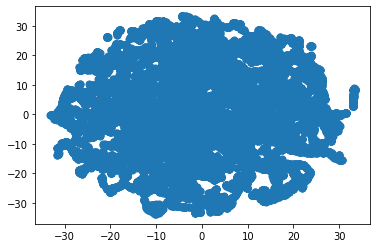

In [ ]:
data = (tsne_result[:][0], tsne_result[:][1])
fig = plt.figure()
ax = plt.subplot(1,1,1)
ax.scatter(tsne_result[:,0],tsne_result[:,1],s=50,label=(1,2))
plt.show()

In [ ]:
dates_list =  list(set(dataset["Date"]))
dates_list = sorted(dates_list)
def get_dates_list(dataset,date_data):
  return dataset[dataset.Date == date_data]
print(get_dates_list(dataset,dates_list[0]))

           Date   Latitude  Longitude
0    2021-04-03  21.223025  72.808018
1    2021-04-03  21.169480  72.790440
2    2021-04-03  21.195021  72.798539
3    2021-04-03  21.134580  72.772360
4    2021-04-03  21.166400  72.814610
...         ...        ...        ...
2308 2021-04-03  21.222094  72.896453
2309 2021-04-03  21.154161  72.842467
2310 2021-04-03  21.139207  72.769546
2311 2021-04-03  21.150844  72.836517
2312 2021-04-03  21.168328  72.833847

[2313 rows x 3 columns]


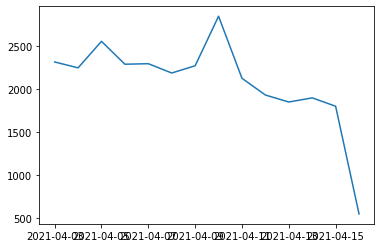

In [ ]:
x = []
y = []
for date in dates_list:
  x.append(date)
  y.append(len(get_dates_list(df,date)))
plt.plot(x, y)

In [ ]:
def cmap_discretize(cmap, N):
    """Return a discrete colormap from the continuous colormap cmap.
    
        cmap: colormap instance, eg. cm.jet. 
        N: number of colors.
    """
    if type(cmap) == str:
        cmap = get_cmap(cmap)
    colors_i = np.concatenate((np.linspace(0, 1., N), (0.,0.,0.,0.)))
    colors_rgba = cmap(colors_i)
    indices = np.linspace(0, 1., N+1)
    cdict = {}
    for ki, key in enumerate(('red','green','blue')):
        cdict[key] = [(indices[i], colors_rgba[i-1,ki], colors_rgba[i,ki]) for i in range(N+1)]
    # Return colormap object.
    return matplotlib.colors.LinearSegmentedColormap(cmap.name + "_%d"%N, cdict, 1024)

In [ ]:
from pylab import rcParams
from scipy.spatial import ConvexHull
%matplotlib inline
colors = plt.get_cmap('jet')(np.linspace(0.0, 2.0, 50))
color_cluster = ['b','g','r','c','m','y','tab:brown','tab:pink','tab:purple','lime','sandybrown','peru','orangered','maroon','teal','thistle']
# colors = cmap_discretize(matplotlib.cm.jet, 50)
rcParams['figure.figsize'] = (25,20)

def plot_map(df,label_hdb,clustername_date):
  print("df")
  print(df)
  llong =72.700080 
  ulong= 72.920030
  llat = 21.063280
  ulat = 21.306330
  # my_map = Basemap(projection='merc',
  #             resolution = 'l', area_thresh = 500.0,
  #             llcrnrlon=llong, llcrnrlat=llat, #min longitude (llcrnrlon) and latitude (llcrnrlat)
  #             urcrnrlon=ulong, urcrnrlat=ulat) #max longitude (urcrnrlon) and latitude (urcrnrlat)
  # xs,ys = mymap(np.asarray(dataset["Longitude"]),np.asarray(dataset["Latitude"]))
  mymap = Basemap(projection="merc",resolution='c',llcrnrlon=llong,llcrnrlat=llat,urcrnrlon=ulong,urcrnrlat=ulat)
  mymap.drawcoastlines()
  mymap.drawcountries()
  #my_map.drawmapboundary()
  #my_map.fillcontinents(color = 'white', alpha = 0.3)
  mymap.drawlsmask(land_color='orange', ocean_color='skyblue')
  #my_map.shadedrelief()
  #my_map.bluemarble()
  #my_map.shadedrelief()
  mymap.etopo()
  xs,ys = mymap(np.asarray(df["Longitude"]),np.asarray(df["Latitude"]))
  df['xm']=xs.tolist()
  df['ym']=ys.tolist()
  # To create a color map
  
  # dataset['xm']=xs.tolist()
  # dataset['ym']=ys.tolist()

  #Visualization1
  for clust_number in set(label_hdb):
      if clust_number == -1:
        c='grey'
      else:
        c = colors[np.int(clust_number)] 
      # c=(([0.0,0.0,0.0]) if clust_number == -1 else colors[np.int(clust_number)])
      clust_set = df[df.clus_hdb_labels == clust_number]  
      print(len(clust_set))                  
      mymap.scatter(clust_set.xm, clust_set.ym, color = c , marker='o', s= 40, alpha = 0.65)
      points = df_date[df_date.clus_hdb_labels == clust_number][['xm', 'ym']].values
      # points = [clust_set.xm, clust_set.ym]
      # get convex hull
      hull = ConvexHull(points)
      # get x and y coordinates
      # repeat last point to close the polygon
      x_hull = np.append(points[hull.vertices,0],
                        points[hull.vertices,0][0])
      y_hull = np.append(points[hull.vertices,1],
                        points[hull.vertices,1][0])
      # plot shape
      plt.fill(x_hull, y_hull, alpha=0.3, c=c)
      if clust_number != -1:
          cenx=np.mean(clust_set.xm) 
          ceny=np.mean(clust_set.ym) 

          plt.text(cenx,ceny,str(clust_number), fontsize=30, color='red',)
          print ("Cluster "+str(clust_number) + ", data points "+ str(len(clust_set)))
        
  plt.savefig("etopo_cluster.png", dpi=300)

In [ ]:
#applying the dbscan algorithm for the first date and seeing what the clustering would be and comparing the results with the 
#hdbscan
def dbscan_algo(df_dates,epsilon):
  covid_df_date = df_dates[["Latitude","Longitude"]]
  # df_dates = StandardScaler().fit_transform(covid_df_date)
  eps_rad = 32 / 6371.0088 #convert to radians
  print("eps_rad "+str(eps_rad))
  db_scan = DBSCAN(eps=epsilon,min_samples=50,algorithm='ball_tree', metric='haversine').fit(np.radians(covid_df_date))
  labels = db_scan.labels_
  print(labels)
  print(set(labels))
  return db_scan,labels

2313
eps_rad 0.005022752440712372
eps_rad 0.005022752440712372
[0 0 0 ... 0 2 2]
{0, 1, 2, -1}
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                0
1    2021-04-03  21.169480  72.790440                0
2    2021-04-03  21.195021  72.798539                0
3    2021-04-03  21.134580  72.772360                0
4    2021-04-03  21.166400  72.814610                0
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                1
2309 2021-04-03  21.154161  72.842467                2
2310 2021-04-03  21.139207  72.769546                0
2311 2021-04-03  21.150844  72.836517                2
2312 2021-04-03  21.168328  72.833847                2

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


1166


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


NameError: ignored

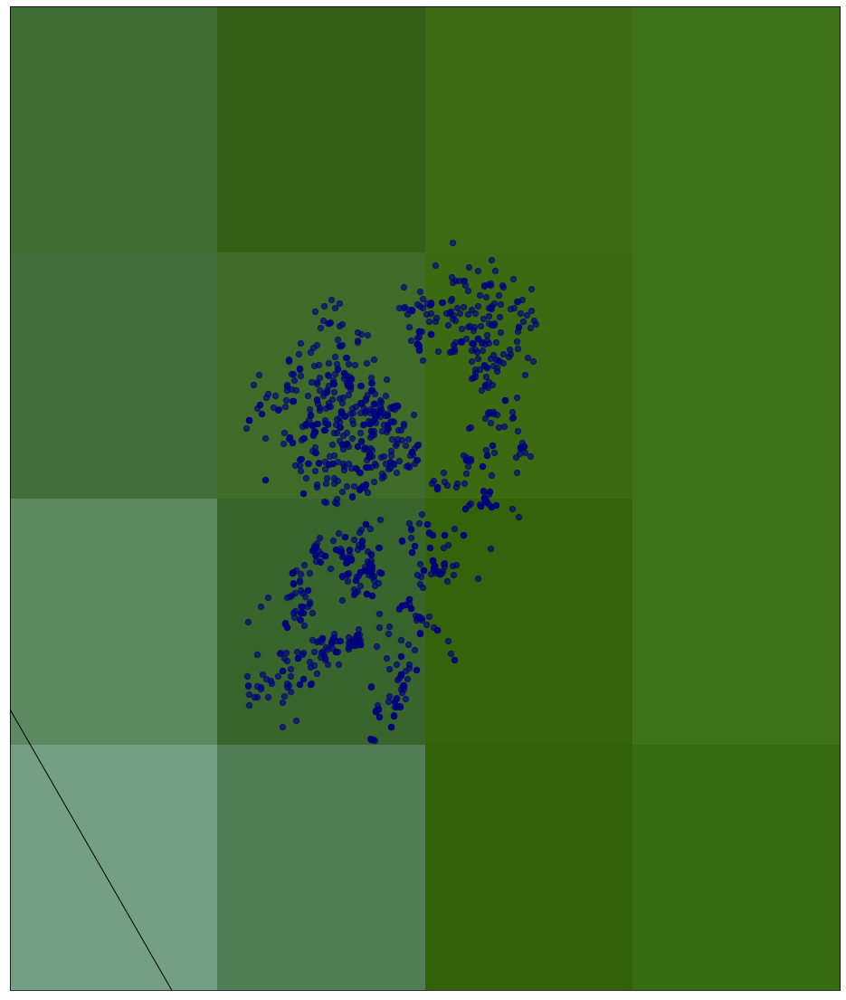

In [ ]:
df_date = get_dates_list(df,dates_list[0])
print(len(df_date))
earth_radius = 6371
eps_rad = 32 / 6371.0088 #convert to radians
print("eps_rad "+str(eps_rad))
epsilon = 0.00018  #calculate 5 meter epsilon threshold
db_scan_model, db_labels = dbscan_algo(df_date,epsilon)
joblib.dump(db_scan_model, "db_scan.pkl")

df_date["clus_hdb_labels"] = db_labels

label_db = list(set(db_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(label_db))

plot_map(df_date,label_db,clustername_date)
plt.show()

In [ ]:
def hdbscan_model(df):
  blobs = df[["Latitude","Longitude"]]
  # blobs = StandardScaler().fit_transform((blobs))
  hdb = HDBSCAN(min_samples=50,metric= 'haversine',gen_min_span_tree=True).fit(np.radians(blobs))
  hdb_labels = hdb.labels_
  print("The validation score is " + str(hdb.relative_validity_))
  # hdb.condensed_tree_.plot()
  return hdb_labels

In [ ]:
help(DBSCAN)

Help on class DBSCAN in module sklearn.cluster._dbscan:

class DBSCAN(sklearn.base.ClusterMixin, sklearn.base.BaseEstimator)
 |  DBSCAN(eps=0.5, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None)
 |  
 |  Perform DBSCAN clustering from vector array or distance matrix.
 |  
 |  DBSCAN - Density-Based Spatial Clustering of Applications with Noise.
 |  Finds core samples of high density and expands clusters from them.
 |  Good for data which contains clusters of similar density.
 |  
 |  Read more in the :ref:`User Guide <dbscan>`.
 |  
 |  Parameters
 |  ----------
 |  eps : float, default=0.5
 |      The maximum distance between two samples for one to be considered
 |      as in the neighborhood of the other. This is not a maximum bound
 |      on the distances of points within a cluster. This is the most
 |      important DBSCAN parameter to choose appropriately for your data set
 |      and distance function.
 |  
 |  min_sample

2313
The validation score is 0.2680659290325375
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                4
1    2021-04-03  21.169480  72.790440               10
2    2021-04-03  21.195021  72.798539                6
3    2021-04-03  21.134580  72.772360               -1
4    2021-04-03  21.166400  72.814610               -1
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                3
2309 2021-04-03  21.154161  72.842467                1
2310 2021-04-03  21.139207  72.769546               -1
2311 2021-04-03  21.150844  72.836517                1
2312 2021-04-03  21.168328  72.833847               -1

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


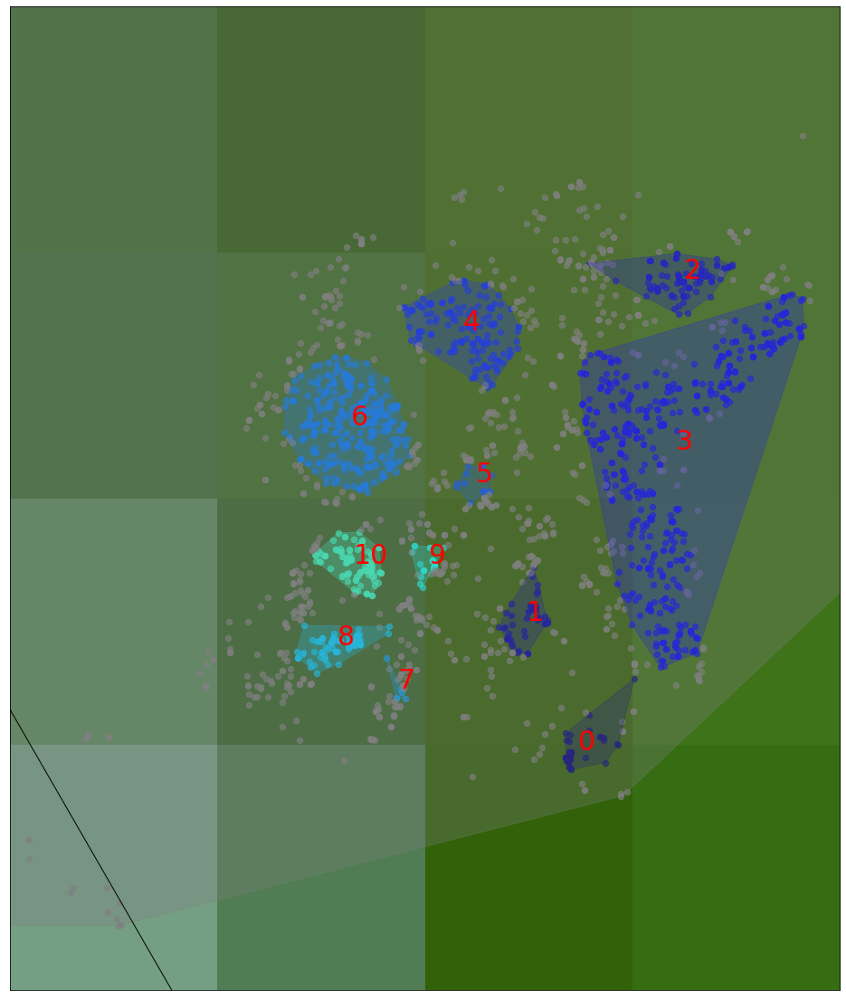

In [ ]:
df_date = get_dates_list(df,dates_list[0])
print(len(df_date))
earth_radius = 6371
epsilon = 0.00018  #calculate 5 meter epsilon threshold
hdb_labels = hdbscan_model(df_date)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()

In [ ]:
#silhoute score of the hdbscan
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), hdb_labels))
#as the result speaks for itself this clustering is not proper


Silhouette Coefficient: -0.132


In [ ]:
#plotting the growth of the particular cluster depending upon the cluster number 
#it is just for observation purpose
#silhoutte score
print(np.radians(df_date[["Latitude","Longitude"]]).shape)
print(len(label_db))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), db_labels, metric='haversine'))

(2313, 2)
4
Silhouette Coefficient: 0.139


In [ ]:
#hdscan with the dbscan 
def hdbscan_model_epsilon(df,epsilon):
  blobs = df[["Latitude","Longitude"]]
  print(type(blobs))
  # blobs = StandardScaler().fit_transform(blobs)
  hdb = HDBSCAN(min_cluster_size = 30, min_samples=10,
                gen_min_span_tree=True, metric = 'haversine',algorithm = 'best', cluster_selection_epsilon=epsilon,prediction_data = True).fit(np.radians(blobs))
  hdb_labels = hdb.labels_
  print("The relative validtiy of the clustering is " + str(hdb.relative_validity_ ))
  # hdb.condensed_tree_.plot()
  return hdb, hdb_labels

In [ ]:
help(HDBSCAN)

Help on class HDBSCAN in module hdbscan.hdbscan_:

class HDBSCAN(sklearn.base.BaseEstimator, sklearn.base.ClusterMixin)
 |  HDBSCAN(min_cluster_size=5, min_samples=None, cluster_selection_epsilon=0.0, metric='euclidean', alpha=1.0, p=None, algorithm='best', leaf_size=40, memory=Memory(location=None), approx_min_span_tree=True, gen_min_span_tree=False, core_dist_n_jobs=4, cluster_selection_method='eom', allow_single_cluster=False, prediction_data=False, match_reference_implementation=False, **kwargs)
 |  
 |  Perform HDBSCAN clustering from vector array or distance matrix.
 |  
 |  HDBSCAN - Hierarchical Density-Based Spatial Clustering of Applications
 |  with Noise. Performs DBSCAN over varying epsilon values and integrates
 |  the result to find a clustering that gives the best stability over epsilon.
 |  This allows HDBSCAN to find clusters of varying densities (unlike DBSCAN),
 |  and be more robust to parameter selection.
 |  
 |  Parameters
 |  ----------
 |  min_cluster_size : i

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.30382740e-05
  7.51452375e-05 7.58236450e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64535466e-05
  7.67199826e-05 7.86028421e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.66220526e-05
  7.76368533e-05 7.88269101e-05]
 ...
 [0.00000000e+00 3.13558042e-03 3.61961810e-03 ... 8.99331883e-01
  8.99331883e-01 8.99404794e-01]
 [0.00000000e+00 3.65182720e-03 4.08026995e-03 ... 8.99528223e-01
  8.99528223e-01 8.99601346e-01]
 [0.00000000e+00 1.69910232e-01 1.70065950e-01 ... 8.99832512e-01
  8.99832512e-01 8.99905963e-01]]


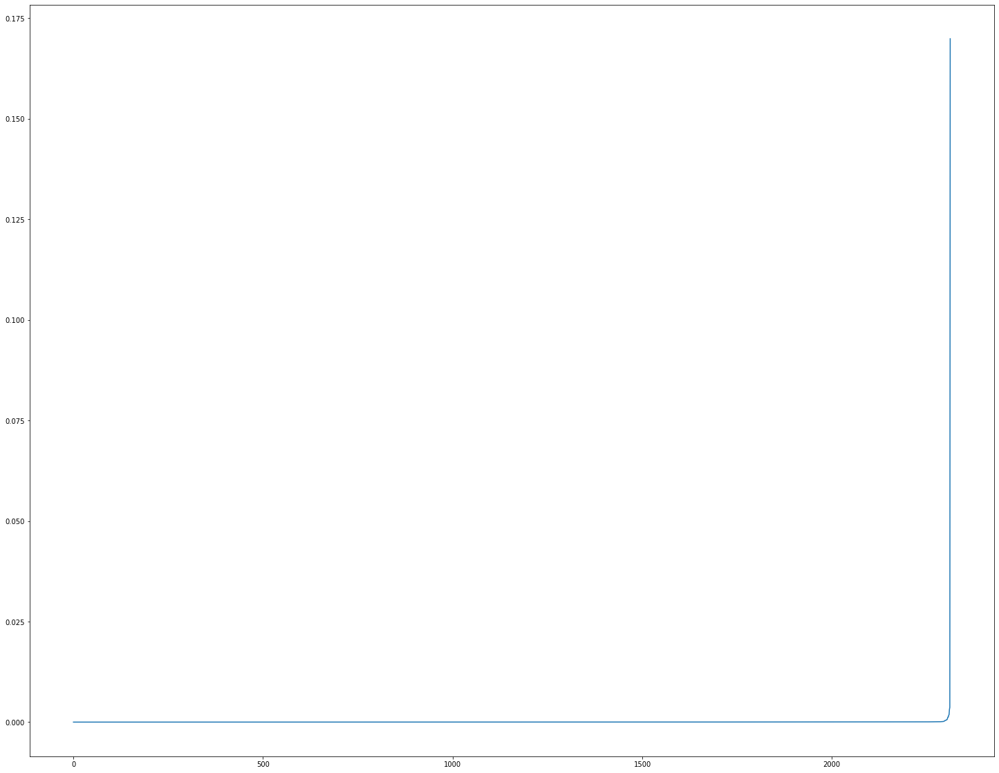

In [ ]:
from sklearn.neighbors import NearestNeighbors
def optimum_eps_value(df_dates):
  neigh = NearestNeighbors(n_neighbors=50)
  nbrs = neigh.fit(np.radians(df_dates[["Latitude","Longitude"]]))
  distances, indices = nbrs.kneighbors(np.radians(df_dates[["Latitude","Longitude"]]))
  distances = np.sort(distances, axis=0)
  print(distances)
  distances = distances[:,1]
  plt.plot(distances)
  # plt.xlim(-5, 5)
  # plt.ylim(0 , .01)
optimum_eps_value(df_date)

In [ ]:
print(np.radians(df[["Latitude","Longitude"]]))

       Latitude  Longitude
0      0.370412   1.270740
1      0.369477   1.270433
2      0.369923   1.270574
3      0.368868   1.270117
4      0.369423   1.270855
...         ...        ...
29134  0.370269   1.272191
29135  0.370685   1.272020
29136  0.369172   1.271044
29137  0.369475   1.271276
29138  0.369314   1.271235

[29139 rows x 2 columns]


12


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


(21.0, 22.0)

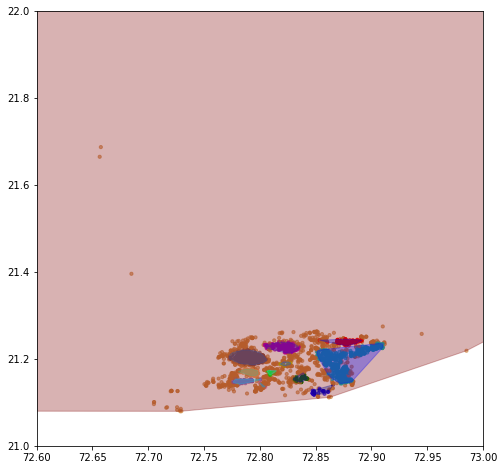

In [ ]:
from scipy.spatial import ConvexHull
import numpy as np
fig, ax = plt.subplots(1, figsize=(8,8))
# plot data
# df_date['color_label'] = 'grey'
color = {}
centroids = []
# for cent in label_hdb:
#   centroid = hdb.weighted_cluster_centroid(cent)

color_cluster = ['b','g','r','c','m','y','tab:brown','tab:pink','tab:purple','lime','sandybrown','peru','orangered','maroon','teal','thistle']
for i in range(len(label_hdb)):
  color[label_hdb[i]] = color_cluster[i]
df_date['color_label'] = df_date.clus_hdb_labels.map(color)

  # df_date[df_date.clus_hdb_labels==label_hdb[i]]['color_label'] = color
  # df_date[df_date.clus_hdb_labels==label_hdb[i]]['color_label'] = color
print(len(set(df_date.color_label)))

plt.scatter(df_date.Longitude, df_date.Latitude, c=df_date.color_label, alpha = 0.6, s=10)
# plot centers
# plt.scatter(cen_x, cen_y, marker='^', c=colors, s=70)
# draw enclosure
for i in df_date.clus_hdb_labels.unique():
    points = df_date[df_date.clus_hdb_labels == i][['Longitude', 'Latitude']].values
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    # plot shape
    plt.fill(x_hull, y_hull, alpha=0.3, c=colors[i])
    
plt.xlim(72.6,73)
plt.ylim(21,22)

<class 'pandas.core.frame.DataFrame'>
The relative validtiy of the clustering is 0.5175453250213451
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                5
1    2021-04-03  21.169480  72.790440               12
2    2021-04-03  21.195021  72.798539                1
3    2021-04-03  21.134580  72.772360               -1
4    2021-04-03  21.166400  72.814610                9
...         ...        ...        ...              ...
2308 2021-04-03  21.222094  72.896453                2
2309 2021-04-03  21.154161  72.842467                7
2310 2021-04-03  21.139207  72.769546               11
2311 2021-04-03  21.150844  72.836517                7
2312 2021-04-03  21.168328  72.833847                7

[2313 rows x 4 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

54
Cluster 0, data points 54
412
Cluster 1, data points 412
629
Cluster 2, data points 629
43
Cluster 3, data points 43
110
Cluster 4, data points 110
216
Cluster 5, data points 216
54
Cluster 6, data points 54
103
Cluster 7, data points 103
50
Cluster 8, data points 50
61
Cluster 9, data points 61
31
Cluster 10, data points 31
99
Cluster 11, data points 99
104
Cluster 12, data points 104
36
Cluster 13, data points 36
311


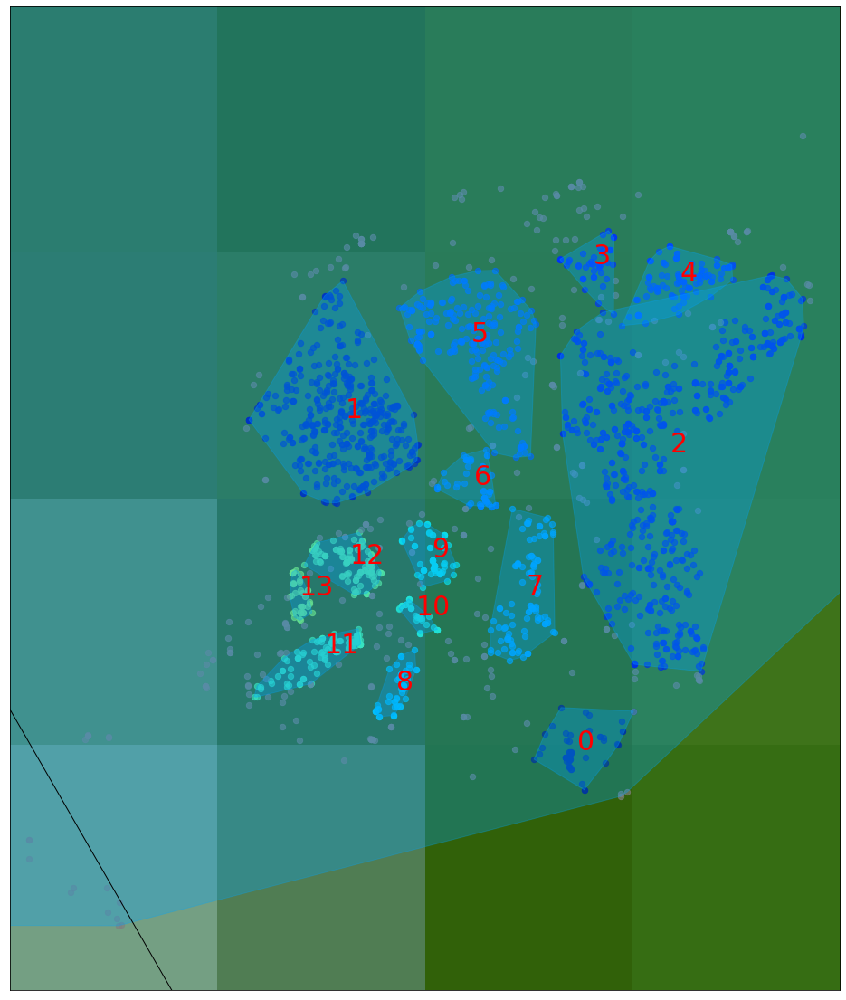

In [ ]:
df_date = get_dates_list(df,dates_list[0])
# print(len(df_date))
earth_radius = 6371
epsilon = 0.000  #calculate 5 meter epsilon threshold
hdb, hdb_labels = hdbscan_model_epsilon(df_date,epsilon)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()

In [ ]:
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(np.radians(df_date[["Latitude","Longitude"]]), hdb_labels))

Silhouette Coefficient: 0.128


In [ ]:
!git clone https://github.com/christopherjenness/DBCV.git

Cloning into 'DBCV'...
remote: Enumerating objects: 133, done.
remote: Total 133 (delta 0), reused 0 (delta 0), pack-reused 133
Receiving objects: 100% (133/133), 126.04 KiB | 5.73 MiB/s, done.
Resolving deltas: 100% (45/45), done.


In [ ]:
!sudo /content/DBCV/setup.py install



sudo: /content/DBCV/setup.py: command not found


In [ ]:
from sklearn.metrics.pairwise import haversine_distances 
from scipy.spatial.distance import euclidean
from DBCV.DBCV import DBCV

In [ ]:
#finding the increase of the cluster
# step 1: predict the model for the day one
# step 2: predict the cluster centroids for the model
# step 3: calculate the distance of all the points from these cluster centroids
# step 4: find the new centroids with the new model and see how the cluster is expanding
# step 5: visualization tasks to be defined later

#change of tasks
# step 2: predict the no of outliers
# step 3: see if the no of outliers is increasing more than threshold
# step 4: find new model


#predict the model for the second day and so on

def model_predict(df_date):
  db_scan_model = joblib.load("db_scan.pkl")
  covid_df_date  = df_date[["Latitude","Longitude"]]
  predicted_labels = db_scan_model.fit_predict(np.radians(covid_df_date))
  no_outliers = np.count_nonzero(predicted_labels == -1)

  return predicted_labels, no_outliers 





In [ ]:
joblib.dump(hdb, "hdb_scan.pkl")

NameError: ignored

In [ ]:
#prediction for the forward dates


The plot for the date 2021-04-03 00:00:00
The no of outliers is 199
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


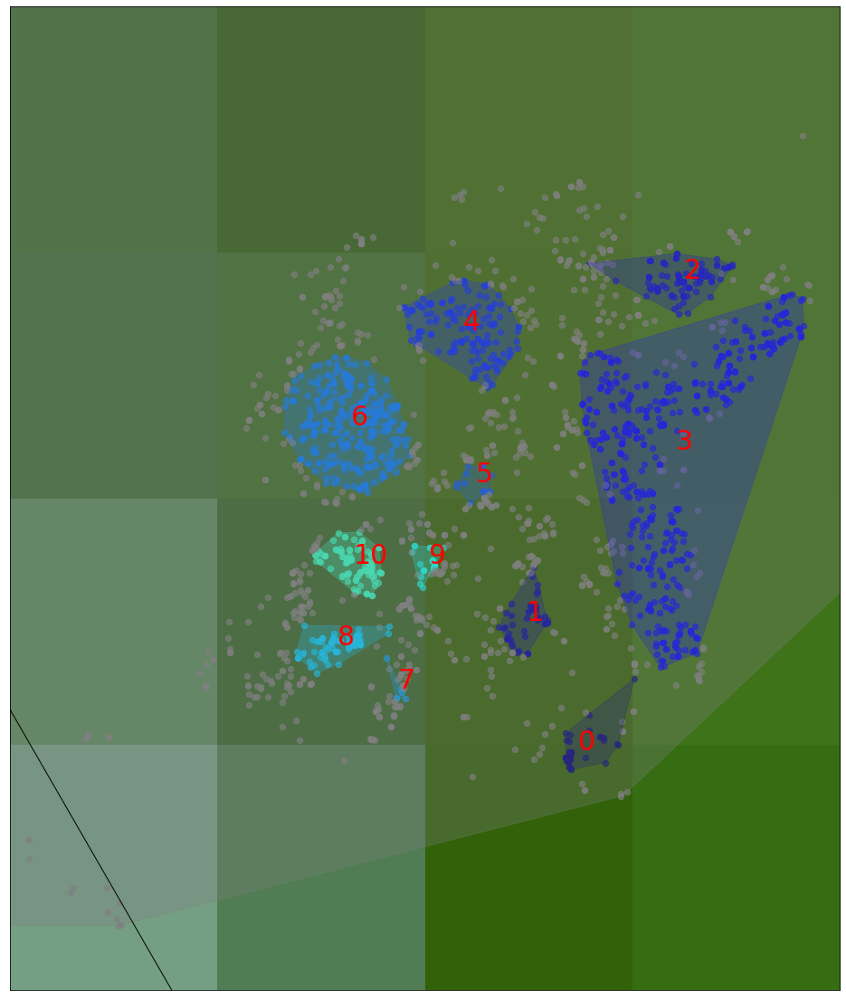

The plot for the date 2021-04-04 00:00:00
The no of outliers is 170
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


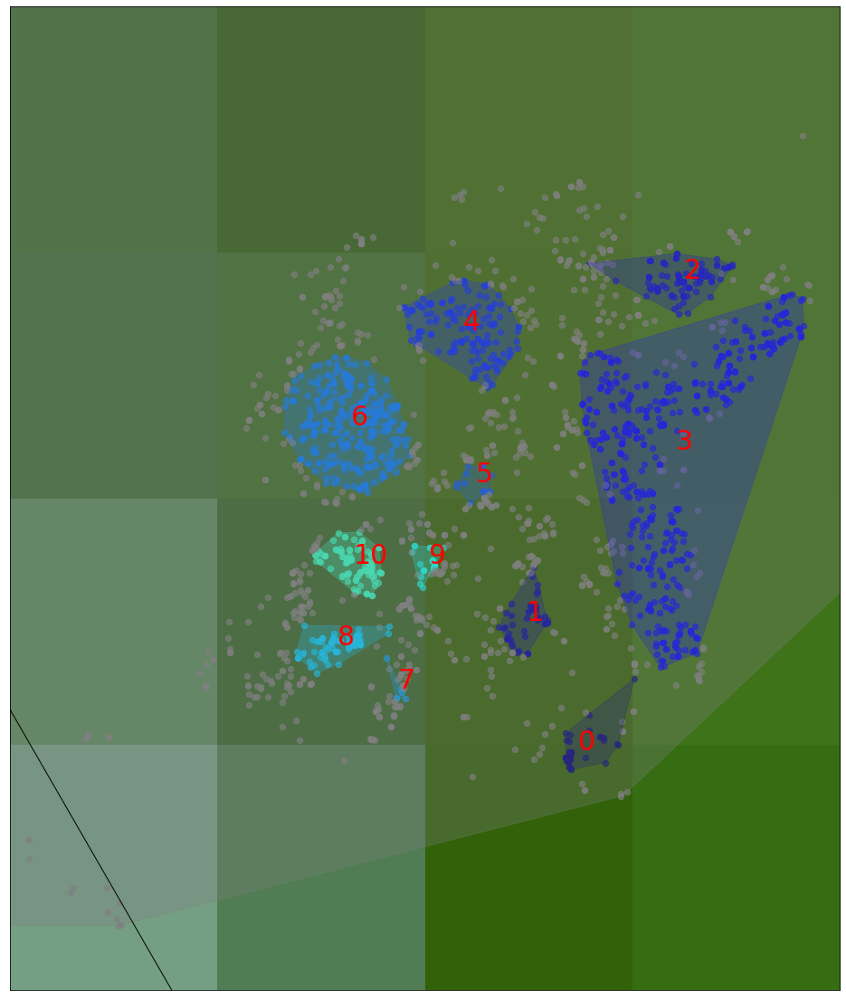

The plot for the date 2021-04-05 00:00:00
The no of outliers is 194
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


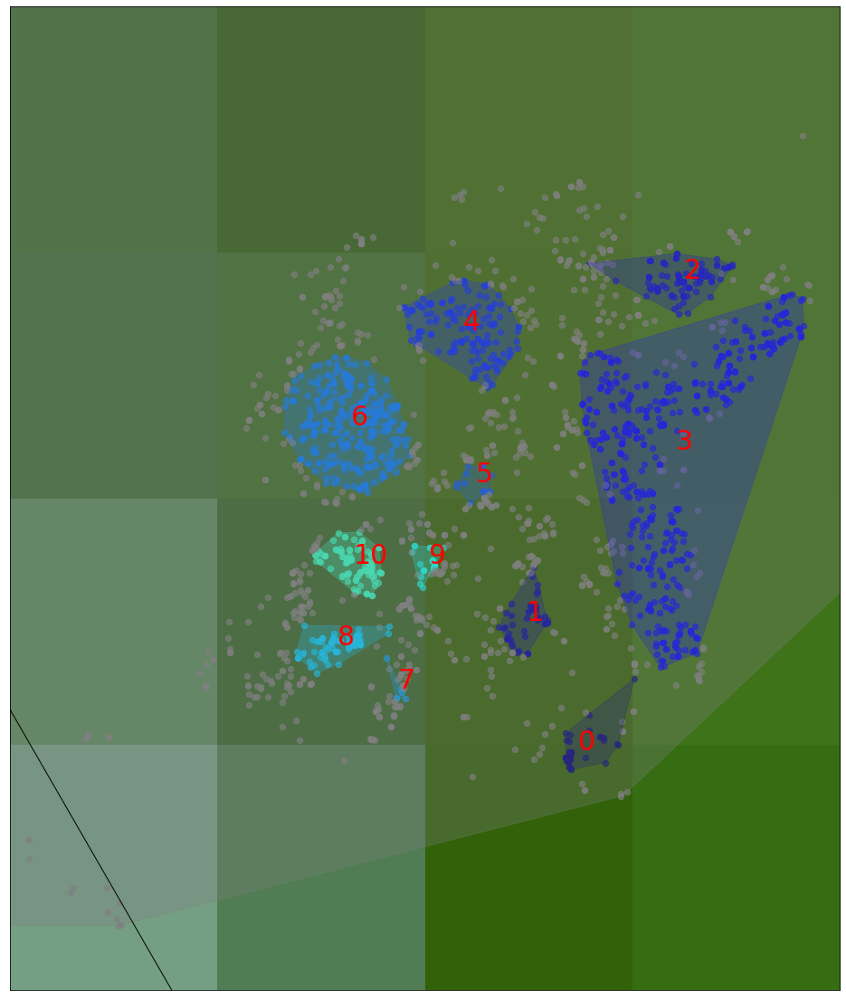

The plot for the date 2021-04-06 00:00:00
The no of outliers is 217
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


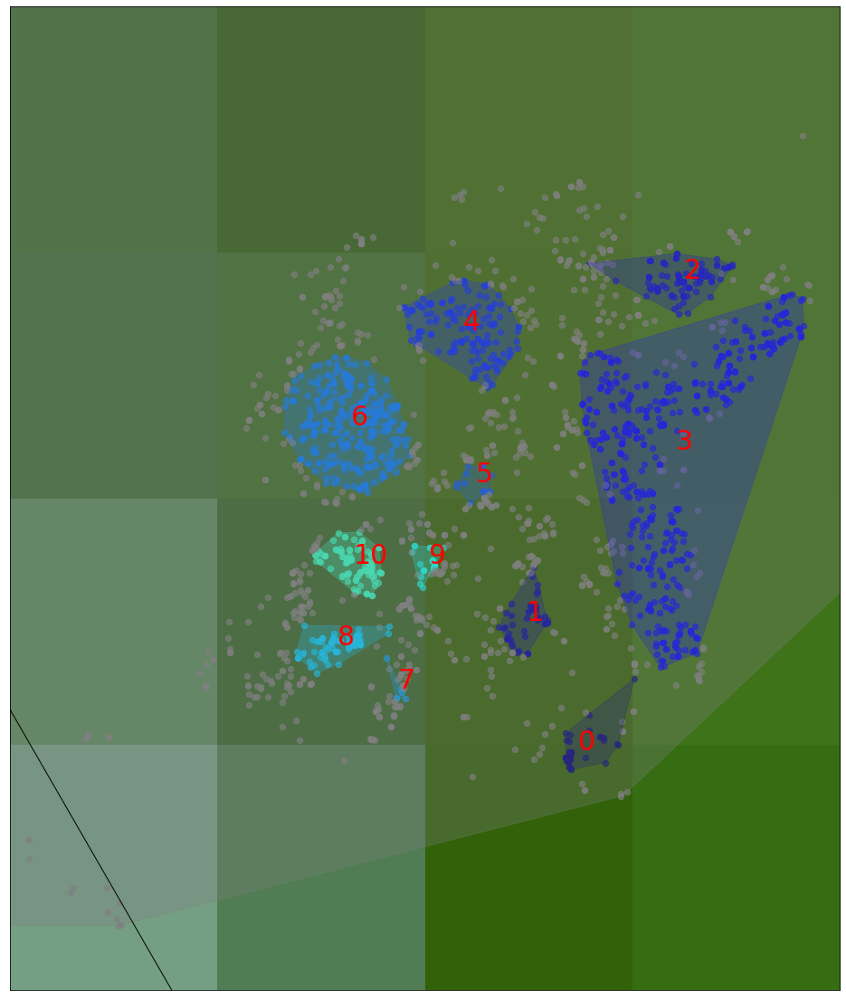

The plot for the date 2021-04-07 00:00:00
The no of outliers is 139
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


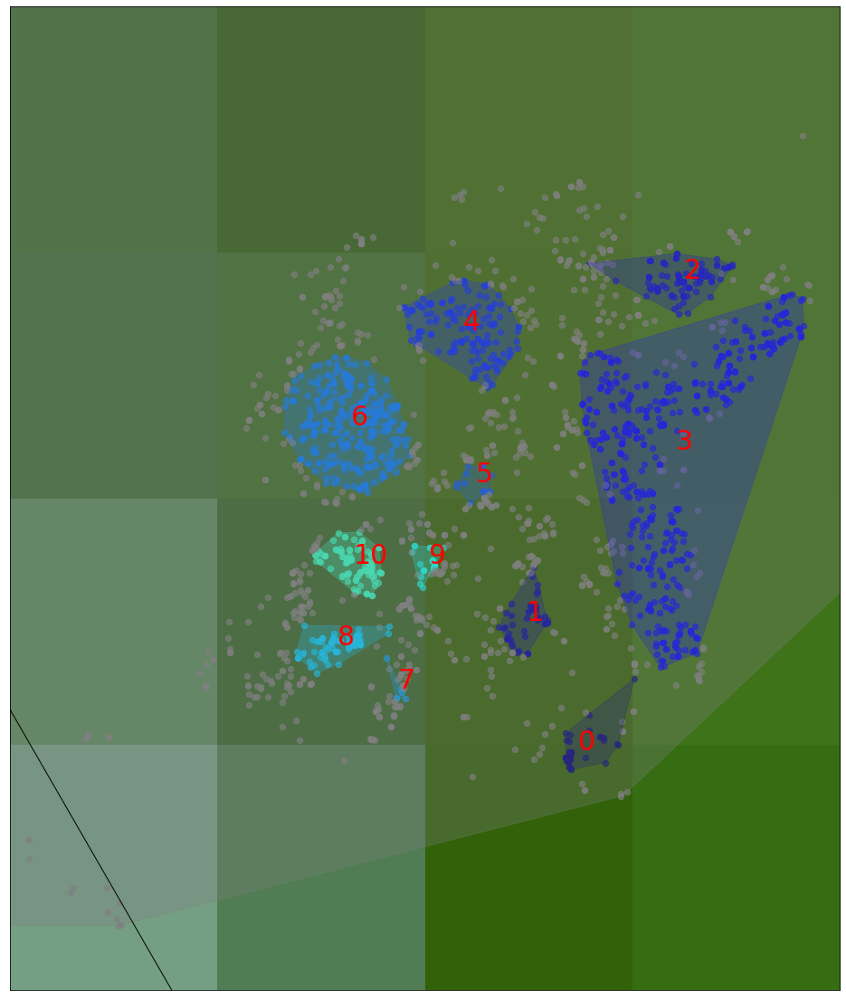

The plot for the date 2021-04-08 00:00:00
The no of outliers is 348
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


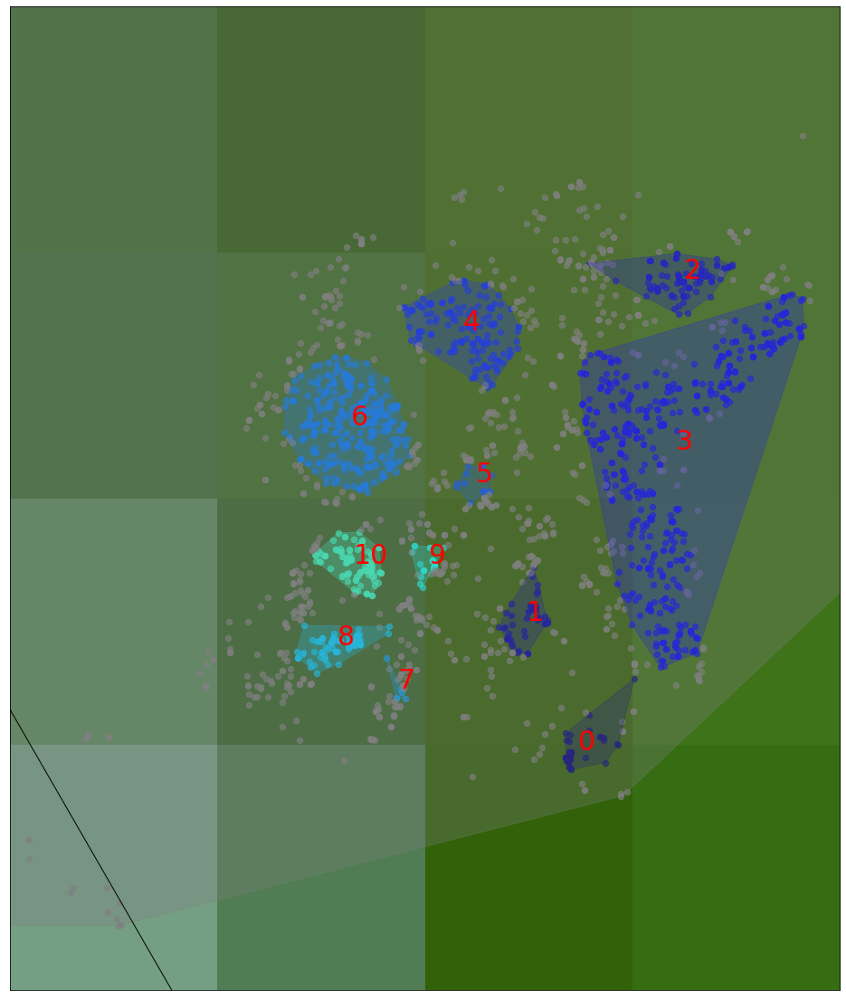

The plot for the date 2021-04-09 00:00:00
The no of outliers is 205
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


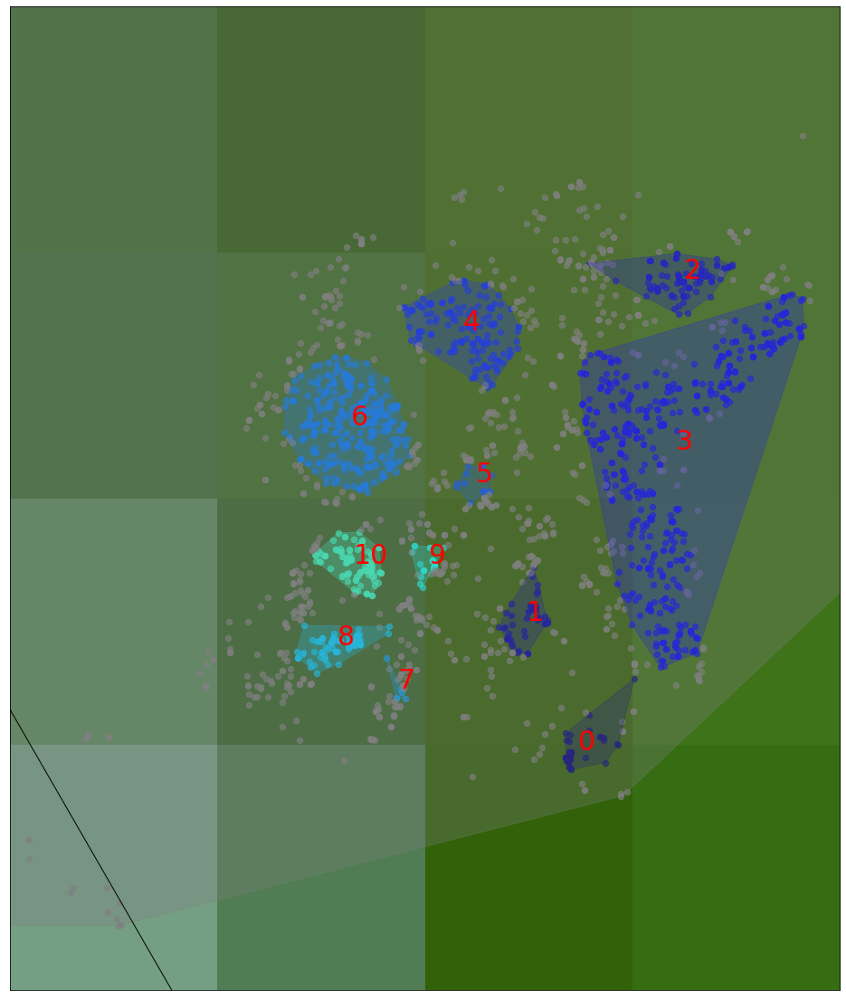

The plot for the date 2021-04-10 00:00:00
The no of outliers is 162
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


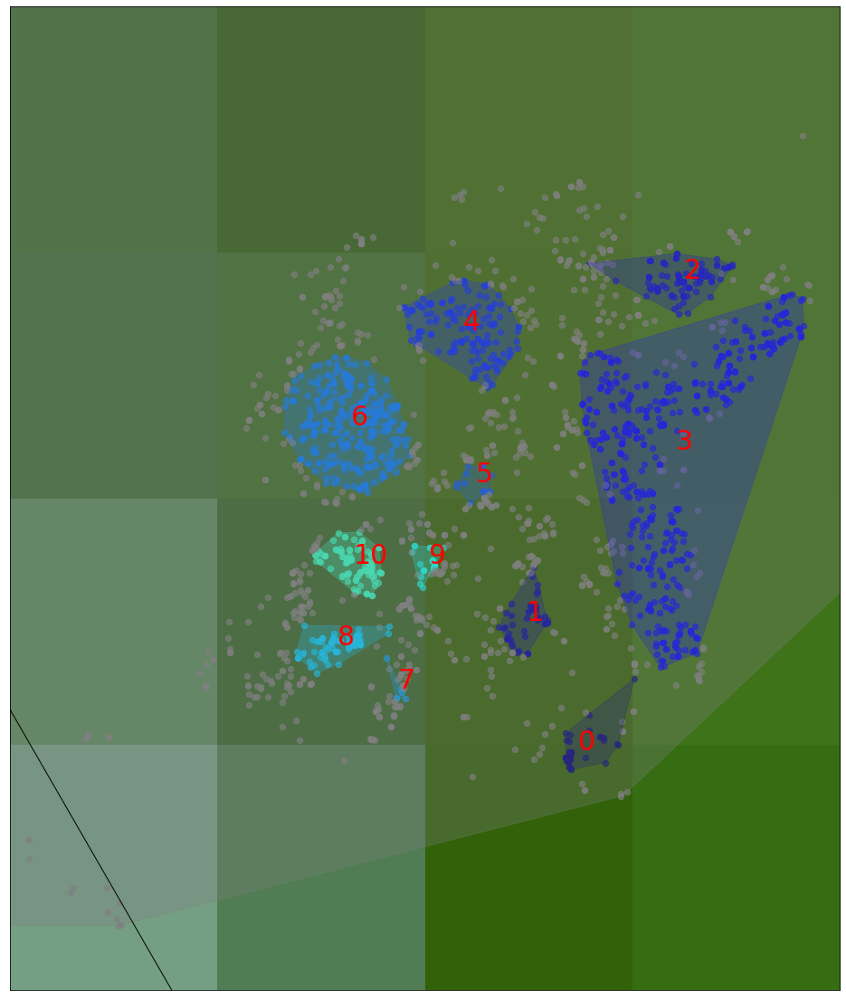

The plot for the date 2021-04-11 00:00:00
The no of outliers is 324
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


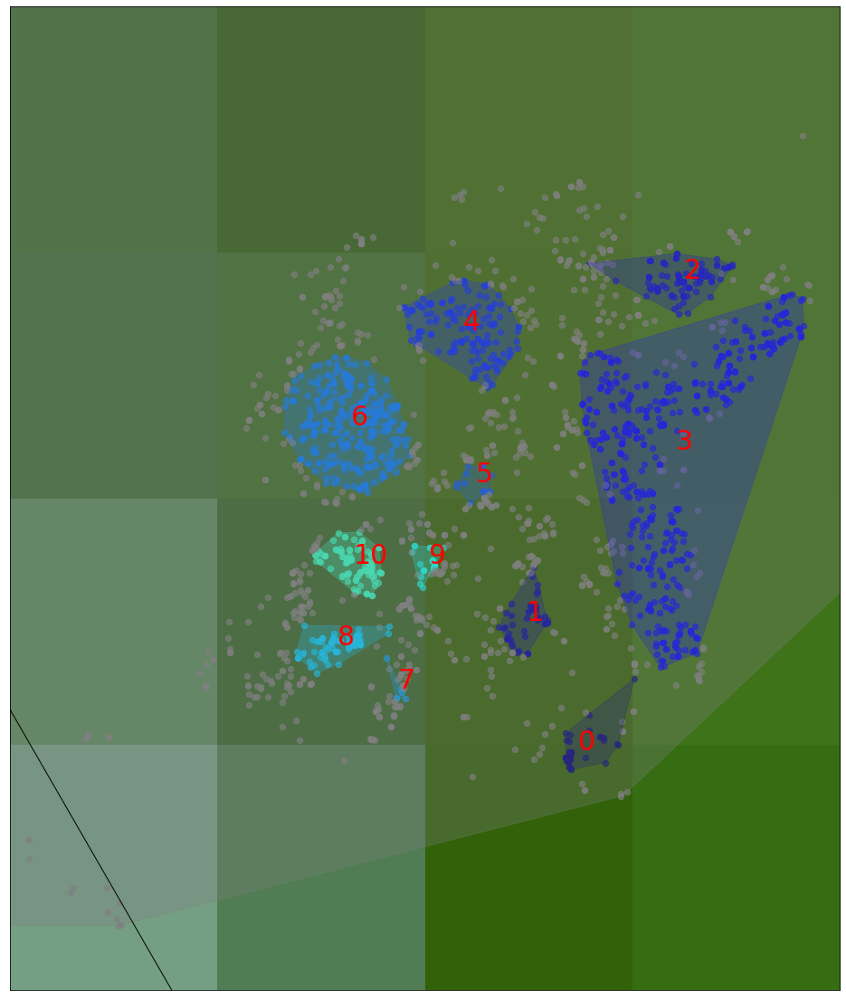

The plot for the date 2021-04-12 00:00:00
The no of outliers is 265
df


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 2021-04-03  21.168328  72.833847  ...  14874.171390  12521.560331      

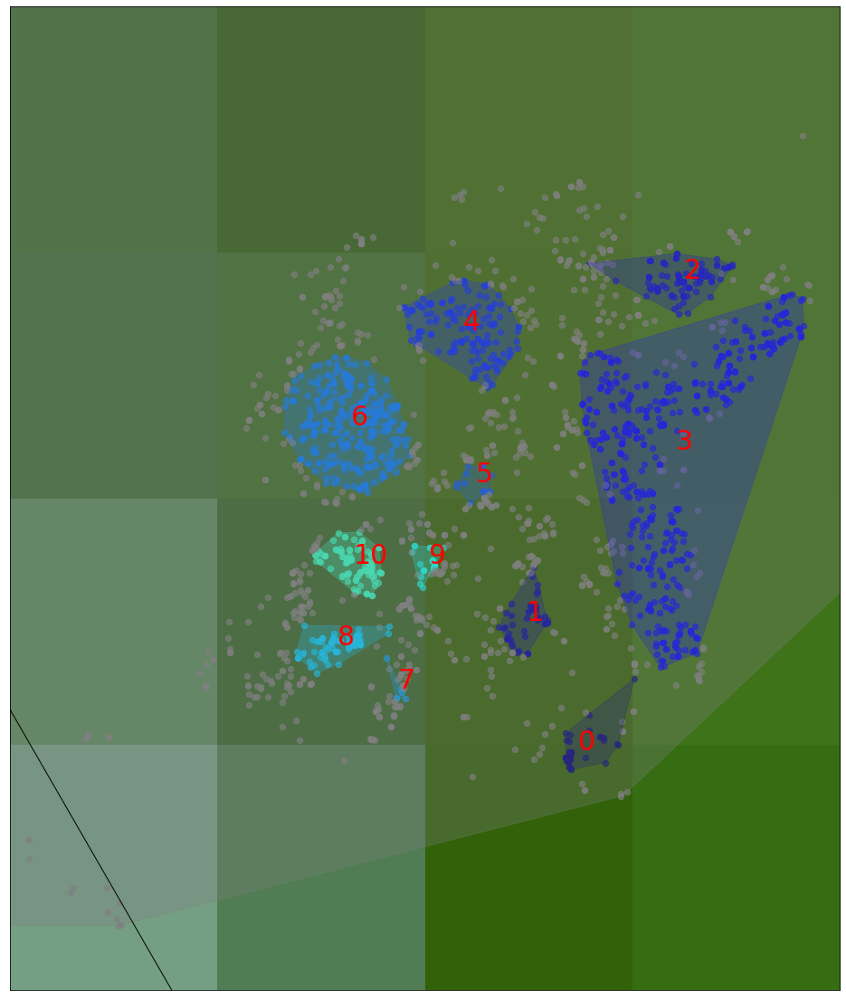

The plot for the date 2021-04-13 00:00:00
The no of outliers is 293
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


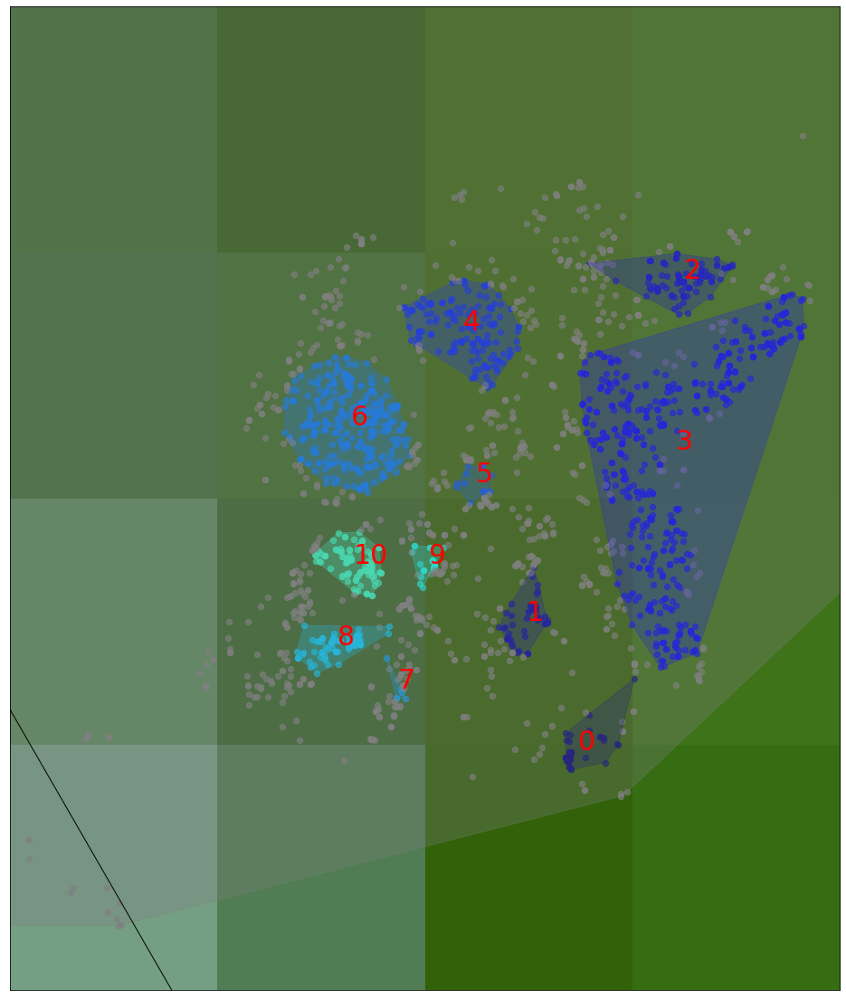

The plot for the date 2021-04-14 00:00:00
The no of outliers is 380
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


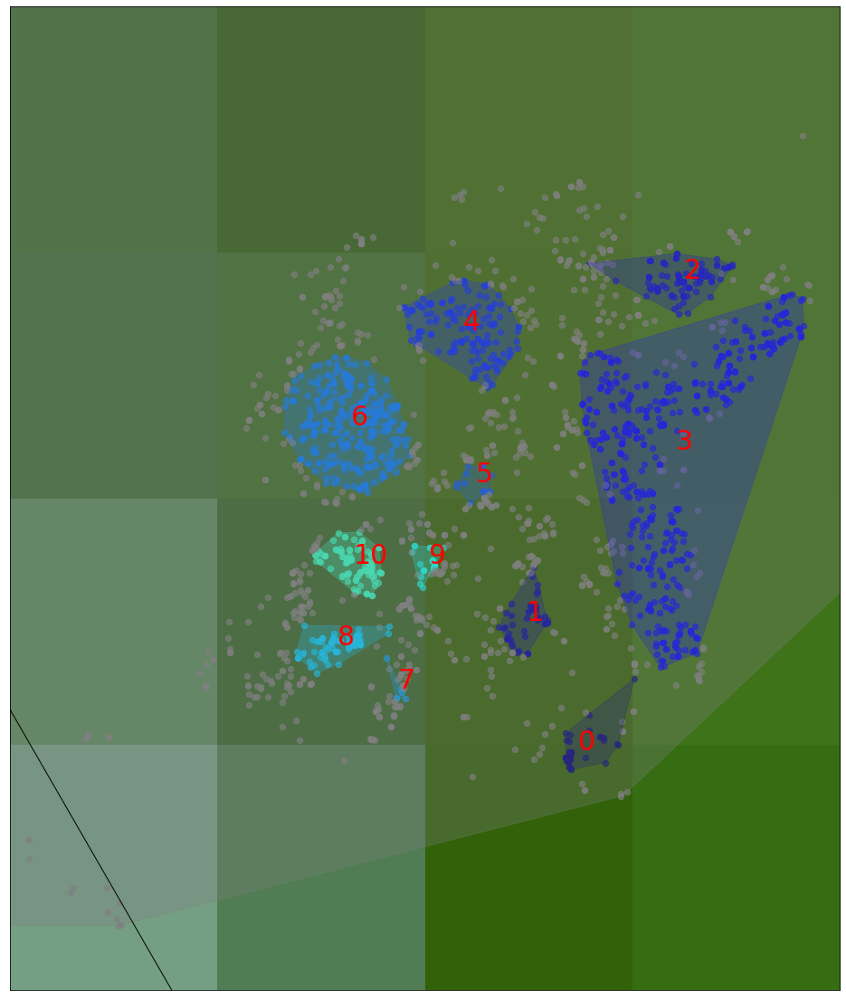

The plot for the date 2021-04-15 00:00:00
The no of outliers is 281
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


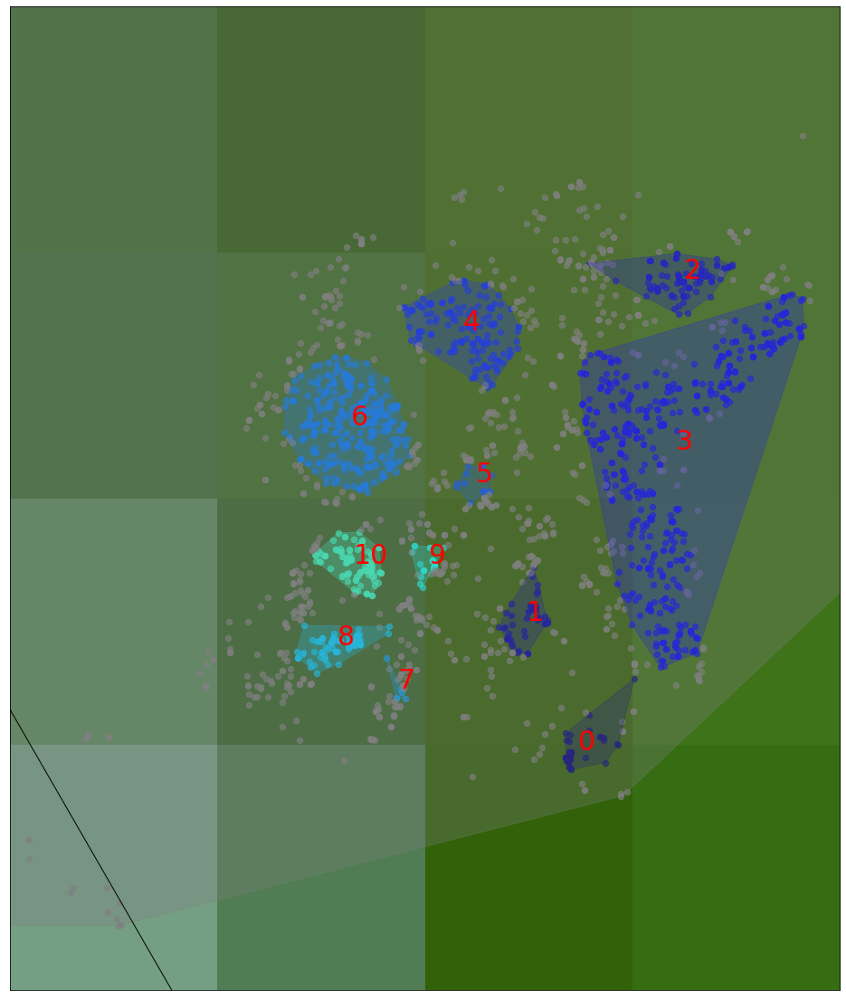

The plot for the date 2021-04-16 00:00:00
The no of outliers is 494
df
           Date   Latitude  Longitude  ...            xm            ym  color_label
0    2021-04-03  21.223025  72.808018  ...  12002.175691  19044.873960            m
1    2021-04-03  21.169480  72.790440  ...  10047.568840  12658.938215   sandybrown
2    2021-04-03  21.195021  72.798539  ...  10948.130567  15704.721344    tab:brown
3    2021-04-03  21.134580  72.772360  ...   8037.165513   8497.891669         peru
4    2021-04-03  21.166400  72.814610  ...  12735.148952  12291.677450         peru
...         ...        ...        ...  ...           ...           ...          ...
2308 2021-04-03  21.222094  72.896453  ...  21835.671048  18933.840280            c
2309 2021-04-03  21.154161  72.842467  ...  15832.704565  10832.368400            g
2310 2021-04-03  21.139207  72.769546  ...   7724.256465   9049.469649         peru
2311 2021-04-03  21.150844  72.836517  ...  15171.050585  10436.900805            g
2312 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


41
Cluster 0, data points 41
48
Cluster 1, data points 48
95
Cluster 2, data points 95
525
Cluster 3, data points 525
156
Cluster 4, data points 156
13
Cluster 5, data points 13
317
Cluster 6, data points 317
6
Cluster 7, data points 6
80
Cluster 8, data points 80
29
Cluster 9, data points 29
102
Cluster 10, data points 102
901


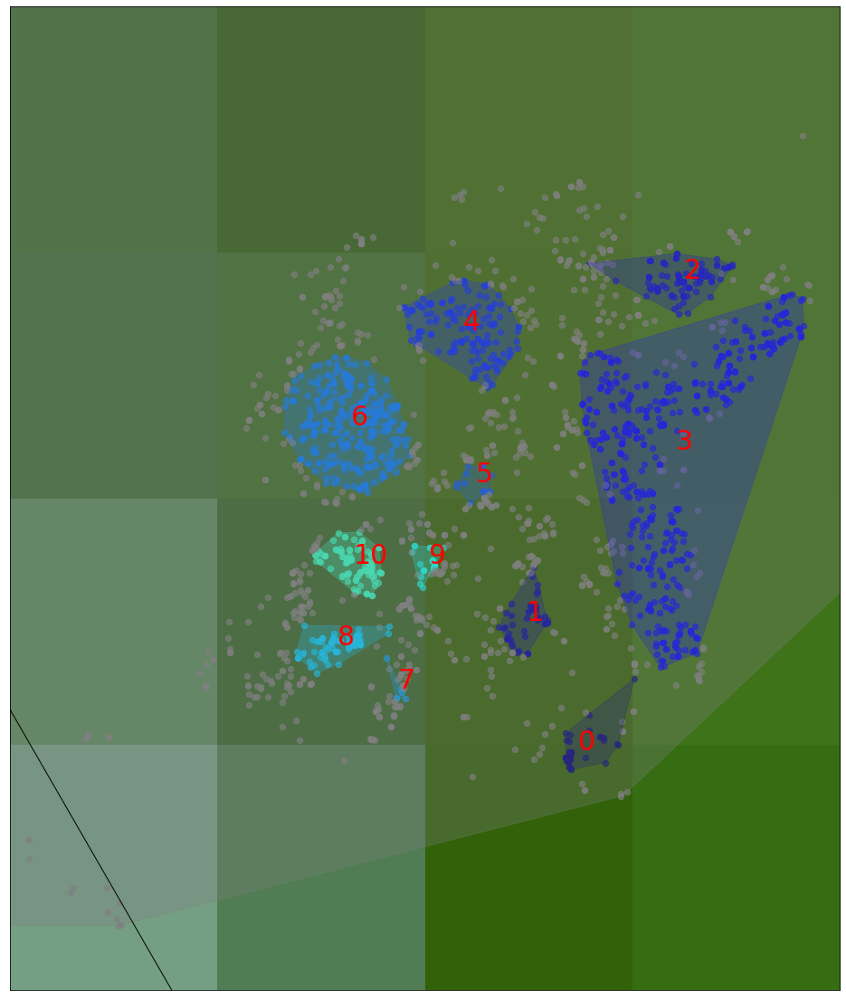

In [ ]:
for dates in dates_list:
  print("The plot for the date " + str(dates))
  date_df = get_dates_list(df, dates)
  labels, no_outliers = model_predict(date_df)
  print("The no of outliers is " + str(no_outliers))
  clustername_date = len(set(labels))
  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()


In [ ]:
#getting the centroids and variance for each cluster 
def variance_centroids(hdb_model,cluster_len,df):
  for i in range(cluster_len):
    #first find the centroids for each cluster
    try:
      centroids = hdb_model.weighted_cluster_centroid(i)
      # print(centroids)
      distance_matrix = df[df.clus_hdb_labels == i]
      distance_matrix = np.radians(df[["Latitude","Longitude"]]).to_numpy()
      # print(distance_matrix.shape)
      distance_matrix = distance_matrix - centroids
      variance  = np.multiply(distance_matrix,distance_matrix)
      variance = np.sum(variance)
      variance = variance /len(df)
      print("variance  " +str( variance))
    except Exception as ex:
      print("Erro calculating the centroid for cluster no %i" % i)
    
    
  

In [ ]:
variance_centroids(hdb,len(set(hdb_labels)),df_date)

variance  0.0024731190039858826
variance  0.0024694280827409995
Erro calculating the centroid for cluster no 2


In [ ]:
import hdbscan
def get_predicted_labels(df,hdb):
  blobs = df[["Latitude","Longitude"]]
  pred_labels,_ = hdbscan.approximate_predict(hdb, np.radians(blobs))
  print(pred_labels)
  return pred_labels
  


[-1 -1 -1 ... -1 -1 -1]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
4553 2021-04-04  21.163619  ...           NaN           NaN
4554 2021-04-04  21.157665  ...           NaN           NaN
4555 2021-04-04  21.165650  ...           NaN           NaN
4556 2021-04-04  21.184863  ...           NaN           NaN
4557 2021-04-04  21.146249  ...           NaN           NaN

[36181 rows x 6 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


3615
Cluster 0, data points 3615
22587
Cluster 1, data points 22587
3259


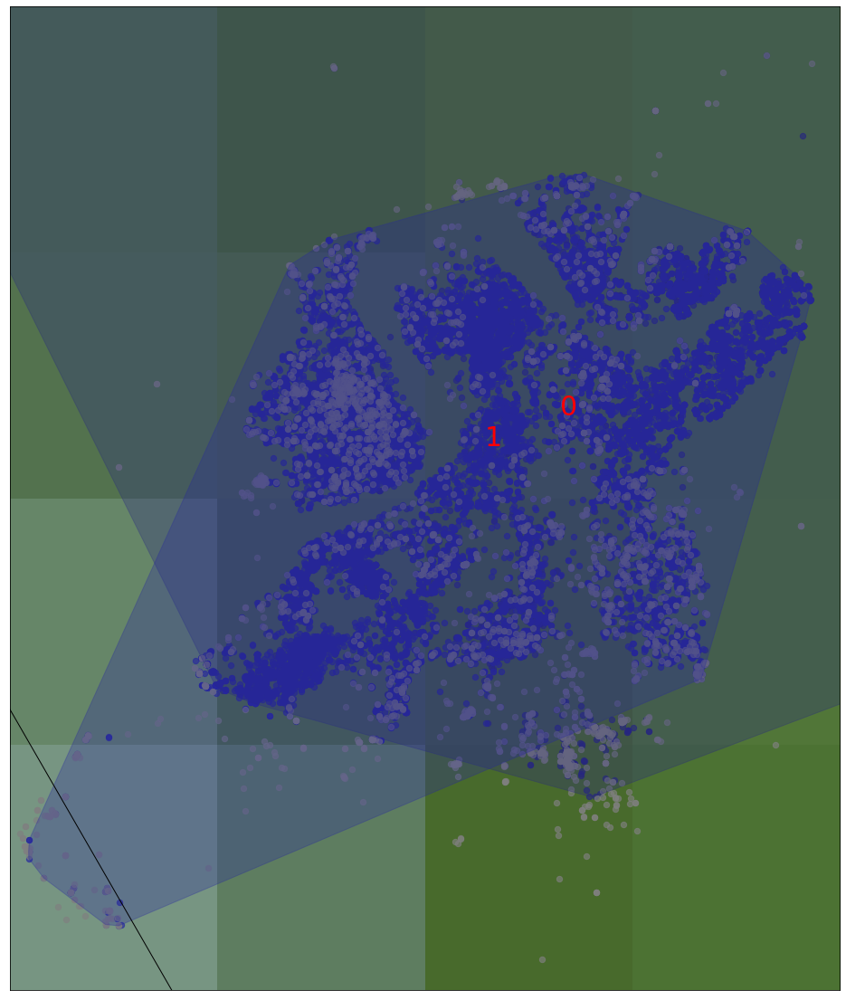

variance  0.0012265958701837677
variance  0.0012220125217008023
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1 -1 ... -1  0  0]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
7105 2021-04-05  21.205525  ...           NaN           NaN
7106 2021-04-05  21.168800  ...           NaN           NaN
7107 2021-04-05  21.122881  ...           NaN           NaN
7108 2021-04-05  21.213431  ...           NaN           NaN
7109 2021

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


3999
Cluster 0, data points 3999
22700
Cluster 1, data points 22700
5017


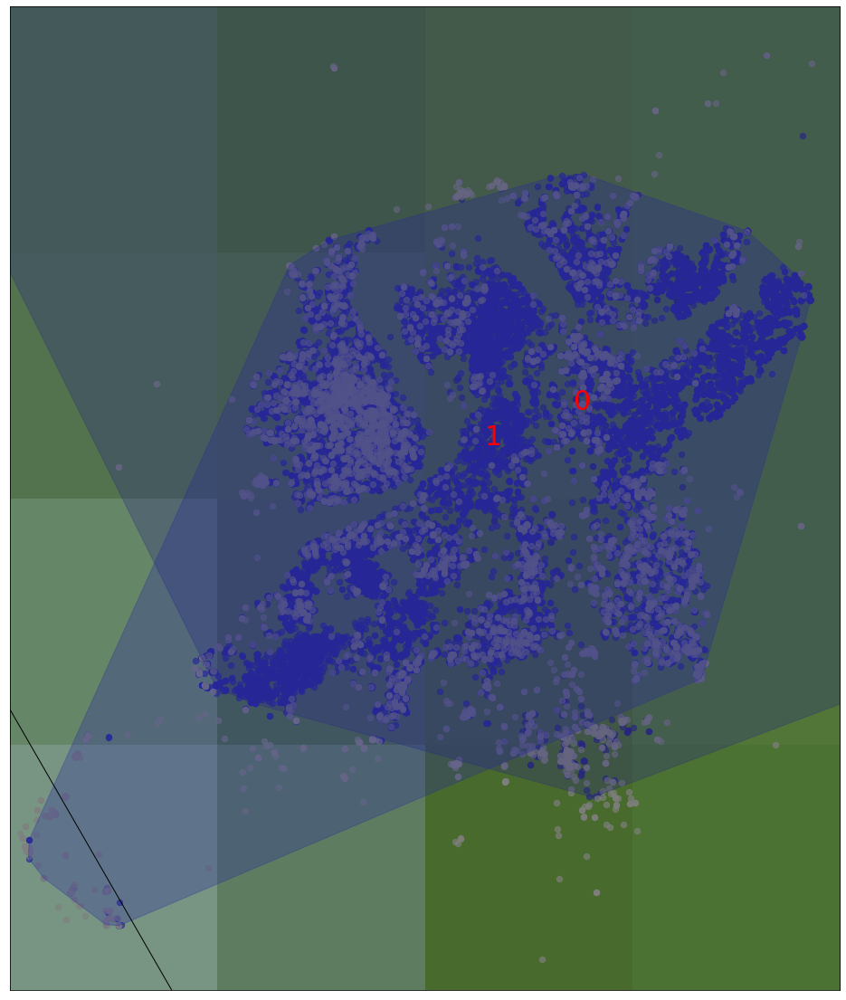

variance  0.0012317498233643037
variance  0.0012271482115623945
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[ 0  0 -1 ... -1 -1  0]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
9392 2021-04-06  21.243340  ...           NaN           NaN
9393 2021-04-06  21.232523  ...           NaN           NaN
9394 2021-04-06  21.147522  ...           NaN           NaN
9395 2021-04-06  21.230184  ...           NaN           NaN
9396 2021

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


4385
Cluster 0, data points 4385
22793
Cluster 1, data points 22793
6606


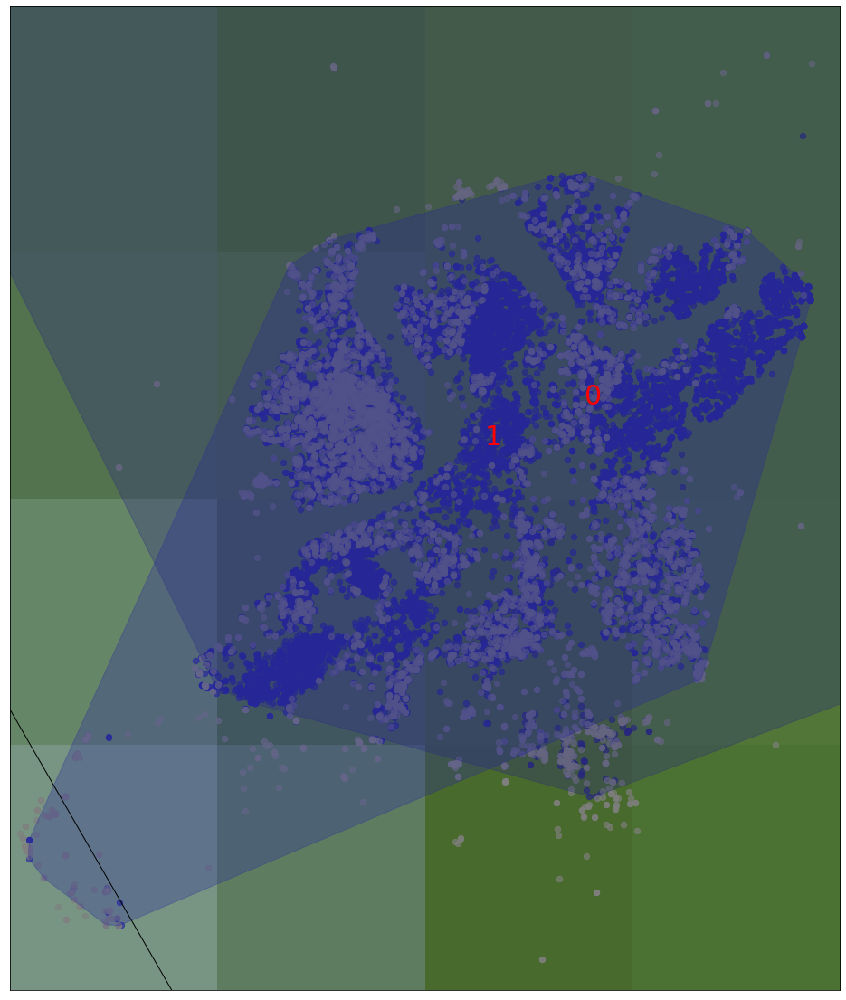

variance  0.0012236378755945266
variance  0.0012190541589109415
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[ 0 -1  0 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
11685 2021-04-07  21.223986  ...           NaN           NaN
11686 2021-04-07  21.189148  ...           NaN           NaN
11687 2021-04-07  21.212353  ...           NaN           NaN
11688 2021-04-07  21.236115  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


4698
Cluster 0, data points 4698
22881
Cluster 1, data points 22881
8215


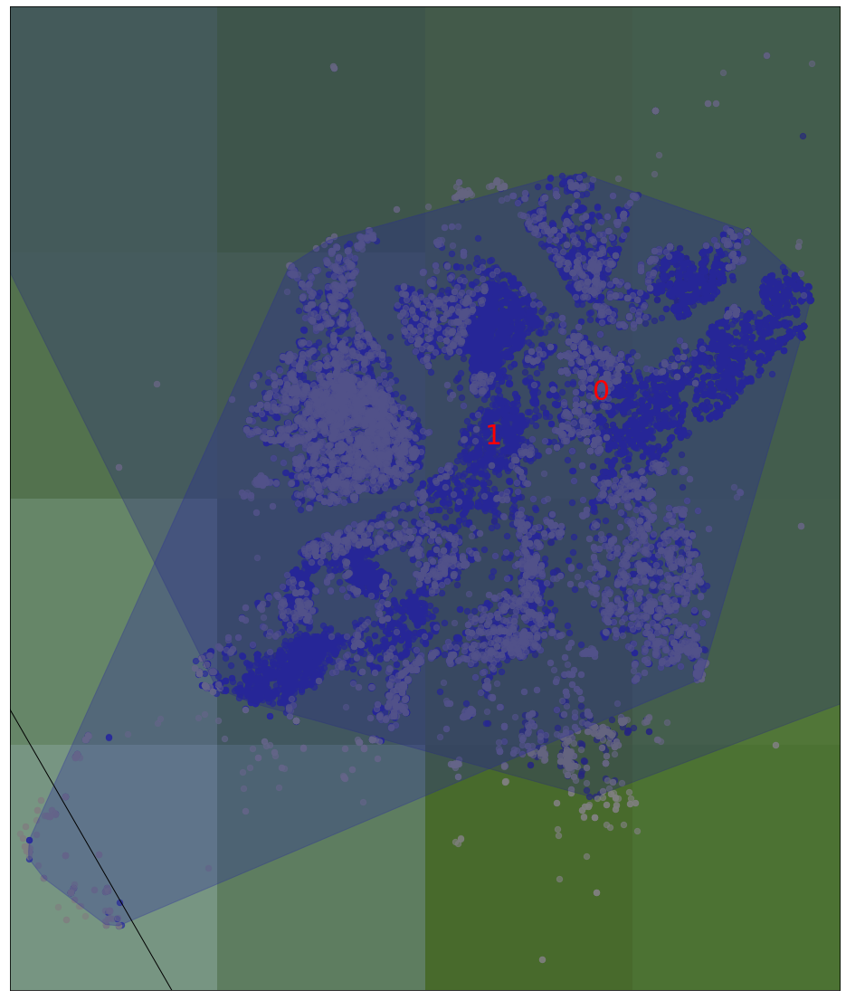

variance  0.0011965540442647308
variance  0.0011920276065776672
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1 -1 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
13870 2021-04-08  21.244172  ...           NaN           NaN
13871 2021-04-08  21.209169  ...           NaN           NaN
13872 2021-04-08  21.210969  ...           NaN           NaN
13873 2021-04-08  21.195138  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


5056
Cluster 0, data points 5056
22937
Cluster 1, data points 22937
9718


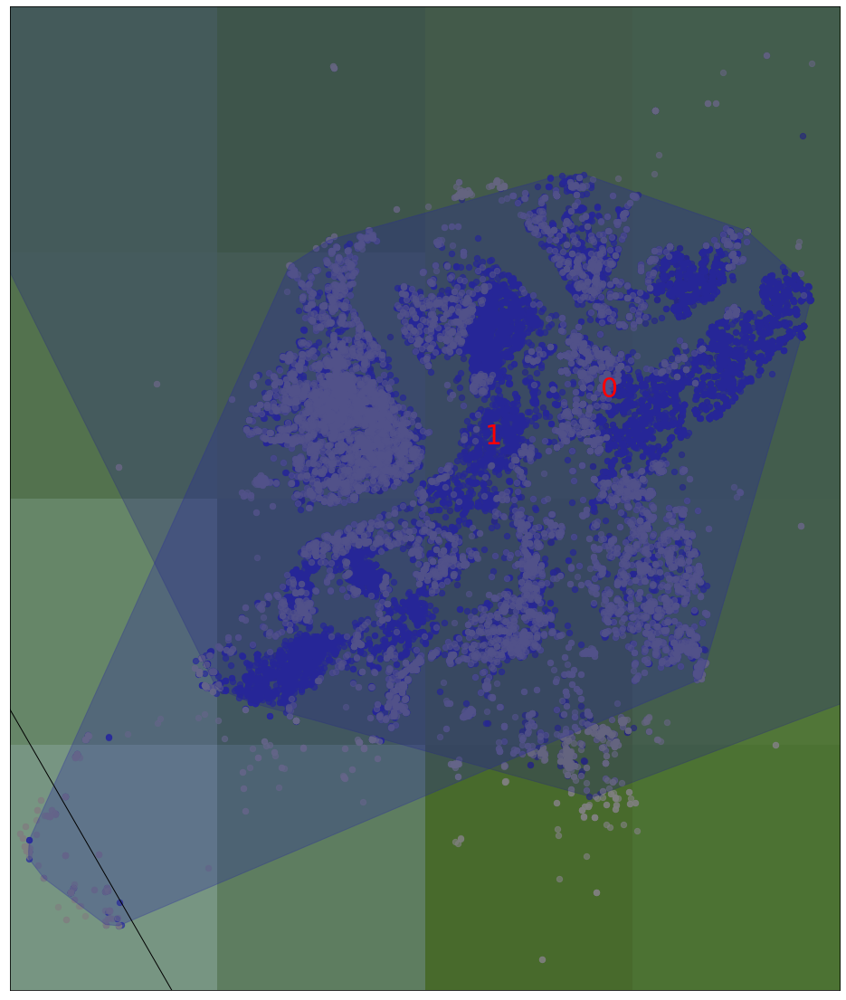

variance  0.0012644334119597748
variance  0.0012596539165983895
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1 -1 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
16139 2021-04-09  21.223474  ...           NaN           NaN
16140 2021-04-09  21.193896  ...           NaN           NaN
16141 2021-04-09  21.189766  ...           NaN           NaN
16142 2021-04-09  21.245752  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


5445
Cluster 0, data points 5445
23054
Cluster 1, data points 23054
11224


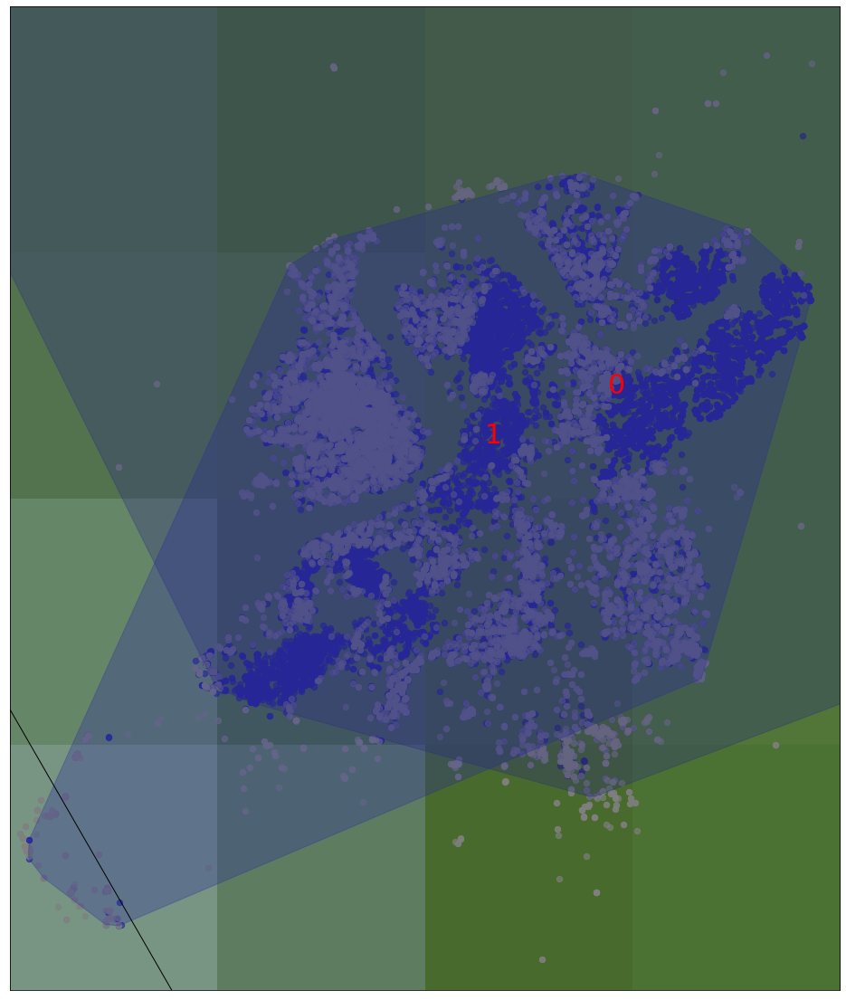

variance  0.0012895889023953064
variance  0.0012848932528619083
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1  0 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
18982 2021-04-10  21.219969  ...           NaN           NaN
18983 2021-04-10  21.196573  ...           NaN           NaN
18984 2021-04-10  21.204861  ...           NaN           NaN
18985 2021-04-10  21.196573  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


5845
Cluster 0, data points 5845
23324
Cluster 1, data points 23324
13065


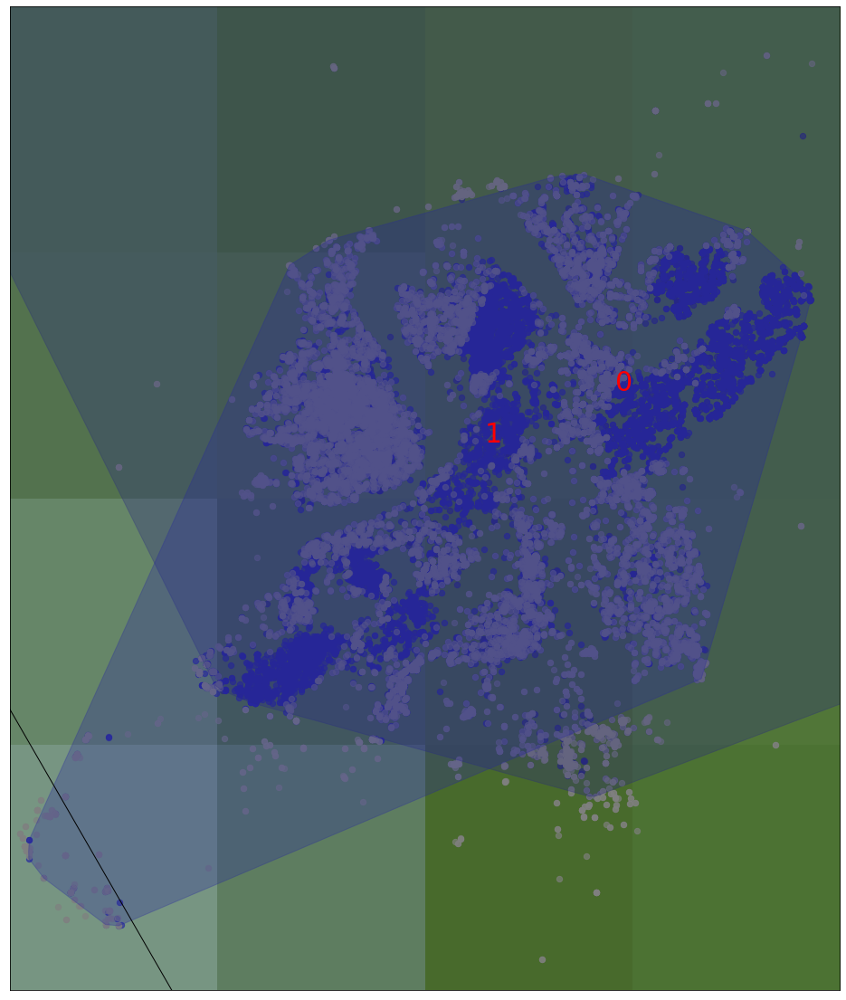

variance  0.0012990830295133932
variance  0.0012943580452487201
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1  1 -1 ... -1 -1  4]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
21106 2021-04-11  21.221817  ...           NaN           NaN
21107 2021-04-11  21.206314  ...           NaN           NaN
21108 2021-04-11  21.206721  ...           NaN           NaN
21109 2021-04-11  21.156170  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


6162
Cluster 0, data points 6162
23473
Cluster 1, data points 23473
14469


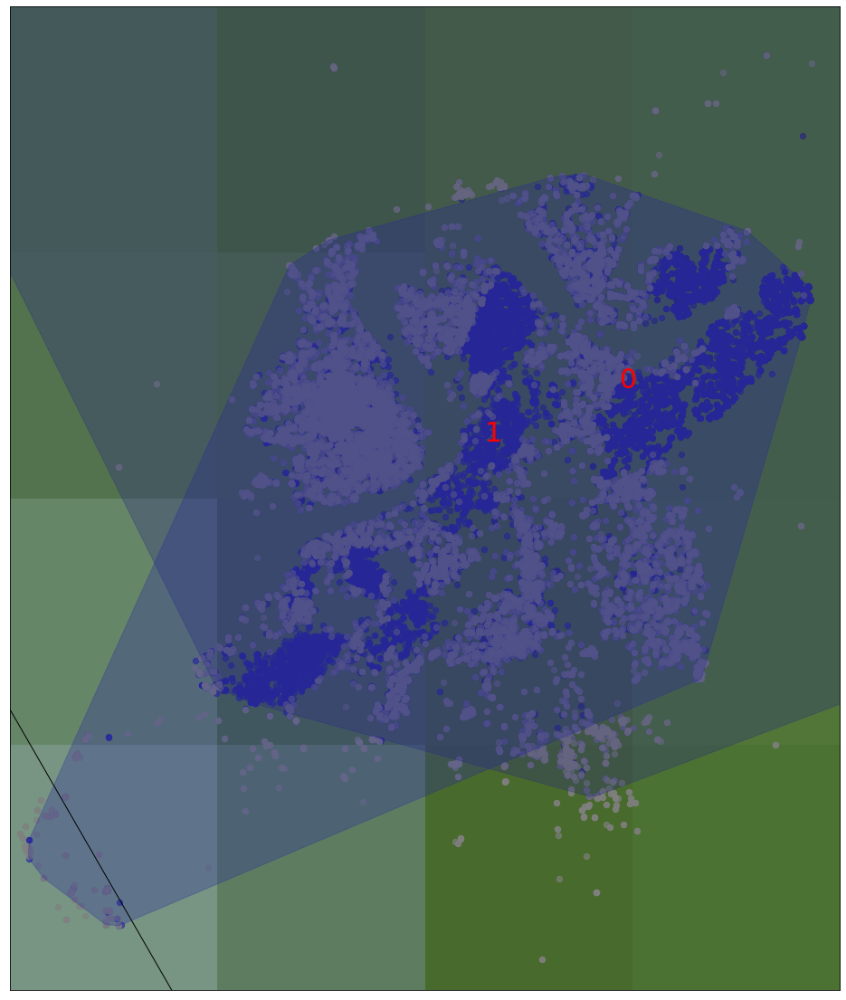

variance  0.0012777700964096503
variance  0.001273102024255485
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1 -1 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
23036 2021-04-12  21.150412  ...           NaN           NaN
23037 2021-04-12  21.122378  ...           NaN           NaN
23038 2021-04-12  21.146422  ...           NaN           NaN
23039 2021-04-12  21.185642  ...           NaN           NaN

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


6425
Cluster 0, data points 6425
23558
Cluster 1, data points 23558
15767


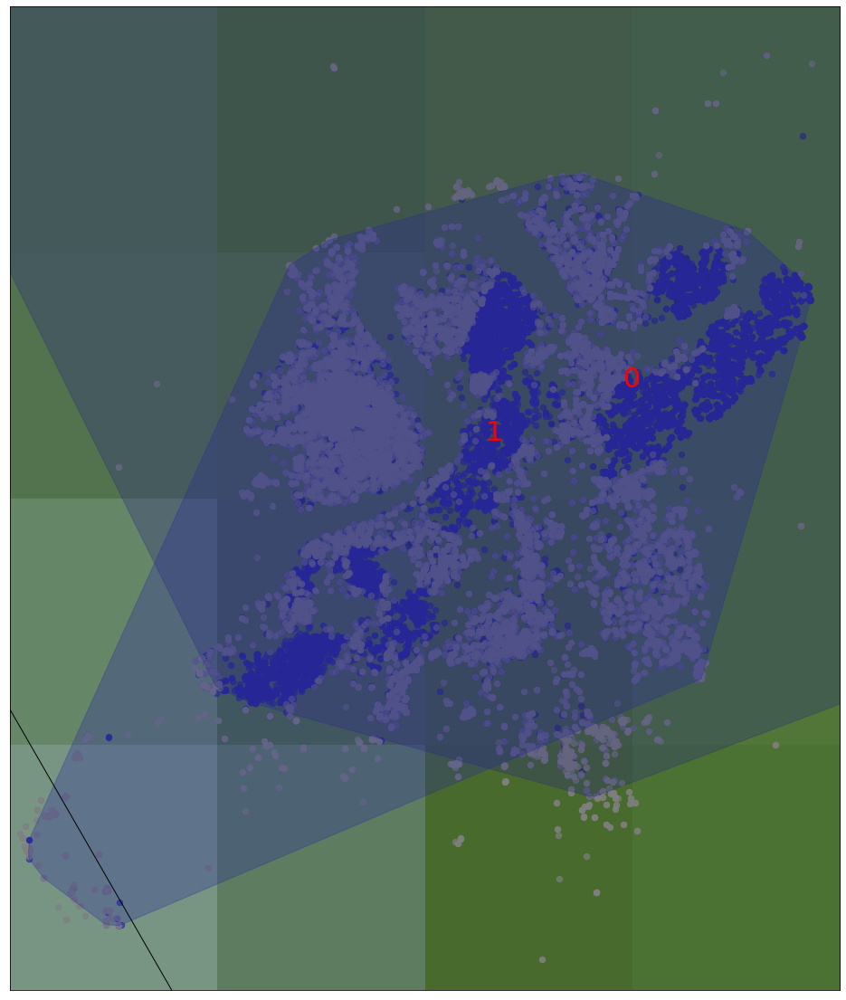

variance  0.0012625549680854251
variance  0.0012579126273835667
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1 -1  2 ...  0 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
24885 2021-04-13  21.236509  ...           NaN           NaN
24886 2021-04-13  21.209130  ...           NaN           NaN
24887 2021-04-13  21.226264  ...           NaN           NaN
24888 2021-04-13  21.154199  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


6731
Cluster 0, data points 6731
23671
Cluster 1, data points 23671
16964


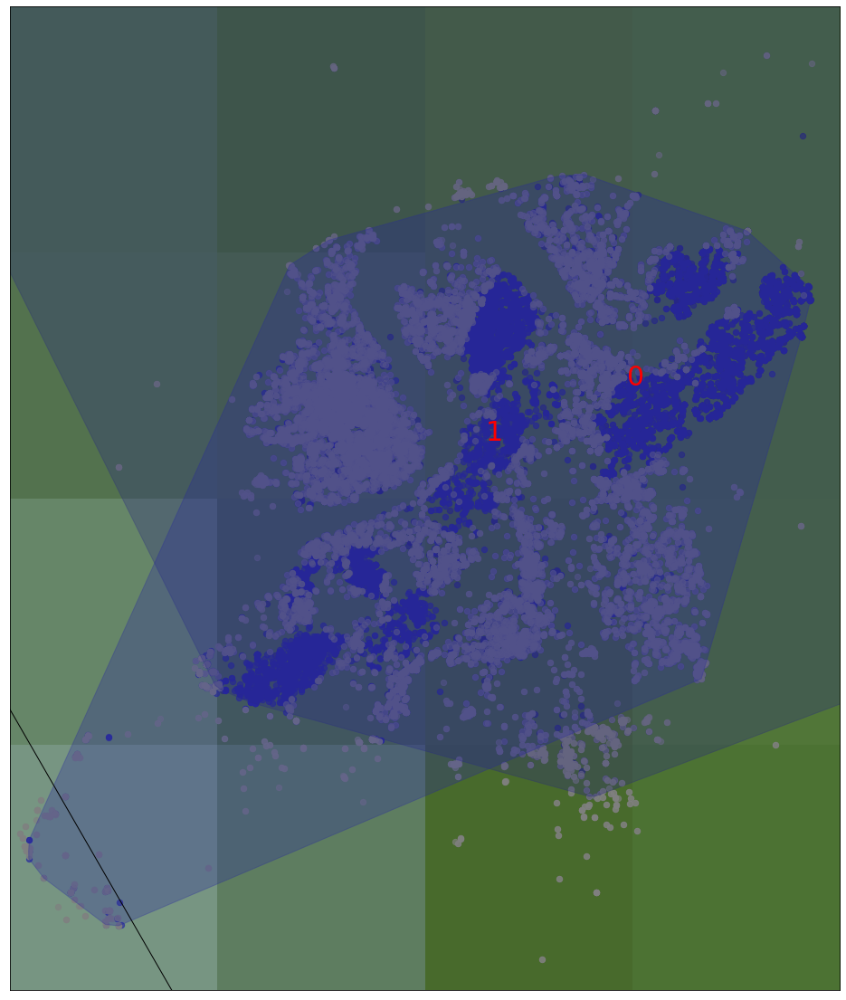

variance  0.001236311897549521
variance  0.0012317510373175803
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[ 2  2  0 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
26782 2021-04-14  21.293729  ...           NaN           NaN
26783 2021-04-14  21.215888  ...           NaN           NaN
26784 2021-04-14  21.209043  ...           NaN           NaN
26785 2021-04-14  21.927327  ...           NaN           NaN

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


6937
Cluster 0, data points 6937
23777
Cluster 1, data points 23777
18321


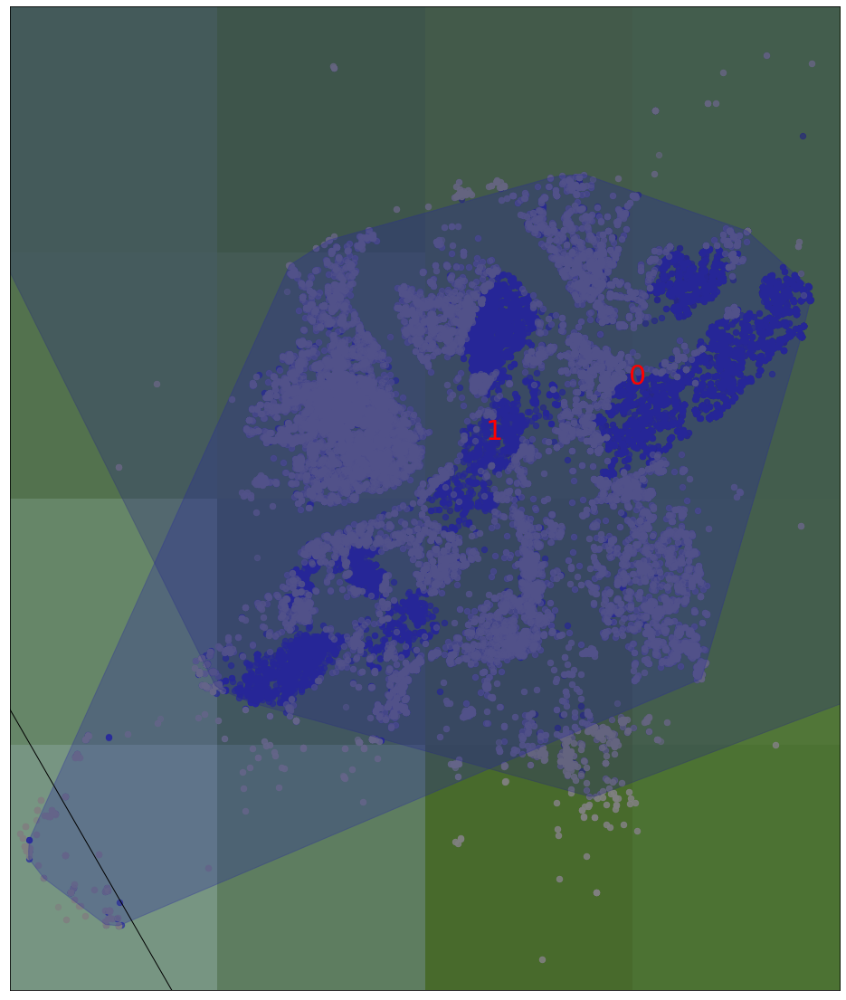

variance  0.0012387255358839511
variance  0.0012341406070340635
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1  0 -1 ... -1 -1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
28582 2021-04-15  21.170880  ...           NaN           NaN
28583 2021-04-15  21.195642  ...           NaN           NaN
28584 2021-04-15  21.222574  ...           NaN           NaN
28585 2021-04-15  21.196461  ...           NaN           Na

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


7178
Cluster 0, data points 7178
23865
Cluster 1, data points 23865
19558


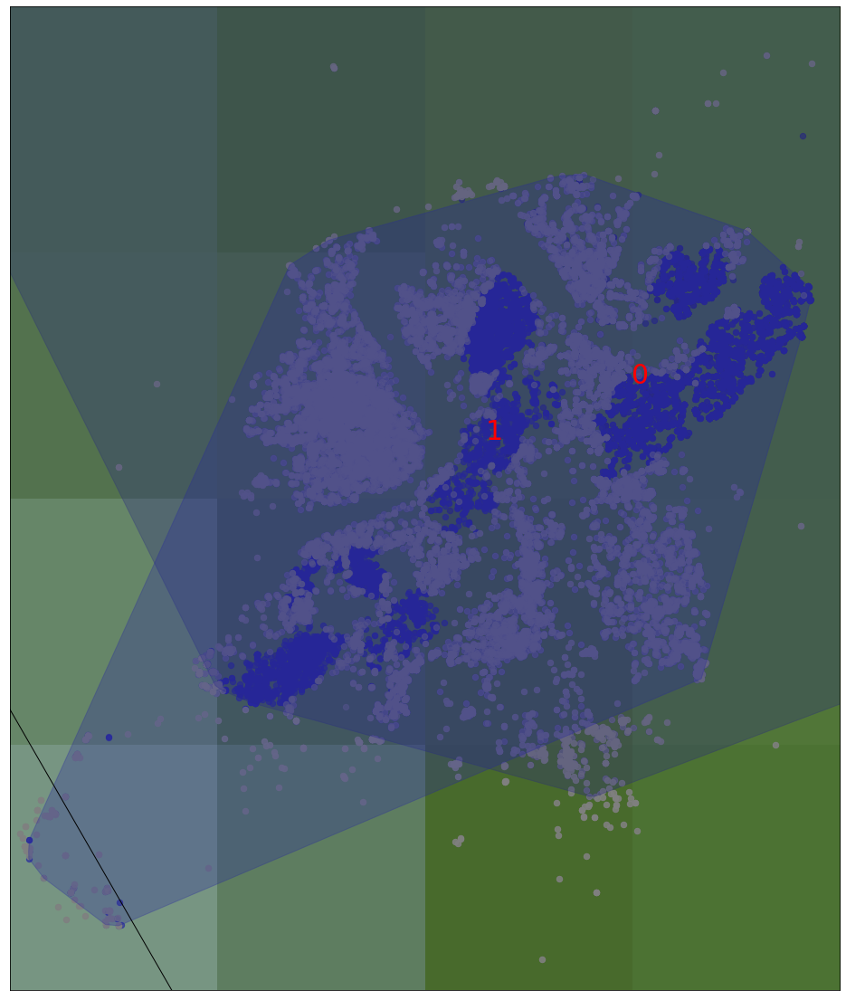

variance  0.0012288302092395092
variance  0.0012242586602120471
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None
[-1  1  1 -1  0  0 -1 -1 -1 -1 -1 -1 -1  5  5  5 -1  1  1 -1 -1  1  1  4
 -1  4  1 -1  4 -1  4 -1 -1  1 -1  1 -1  1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1  3 -1  3  3 -1  0  3 -1  2 -1  2  2  2  4  4 -1 -1  2  2 -1  2  1
 -1  0 -1 -1 -1  1 -1 -1 -1 -1 -1 -1  1  1 -1 -1 -1 -1  1  1  1 -1  1 -1
  5 -1 -1 -1 -1  2 -1  1 -1 -1  2  1 -1 -1  0  0 -1 -1  0  2  0  2  2  0
  2  3  0 -1  0 -1  2  0  0  0  0 -1  2  0 -1  0  2  3 -1 -1  0  2  0 -1
 -1 -1  3  3 -1  3  2  3 -1  3  2 -1 -1  2  2  2  3  0 -1 -1 -1 -1  2 -1
  0 -1 -1  2 -1  3  3  3 -1  3  3 -1  3 -1  3  3  2  3 -1  3 -1 -1  4  2
  3  3  3  3  3  2  3  3  2  5  4 -1 -1 -1  0 -1 -1  4 -1 -1  0 -1  4 -1
  4  0 -1 -1 -1  3 -1 -1  4  4  4  5  4

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
29134 2021-04-16  21.214842  ...           NaN           NaN
29135 2021-04-16  21.238677  ...           NaN           NaN
29136 2021-04-16  21.152022  ...           NaN           NaN
29137 2021-04-16  21.169357  ...           NaN           NaN
29138 2021-04-16  21.160154  ...           NaN           NaN

[60762 rows x 6 columns]
7308
Cluster 0, data points 7308
23903
Cluster 1, data points 23903
19772


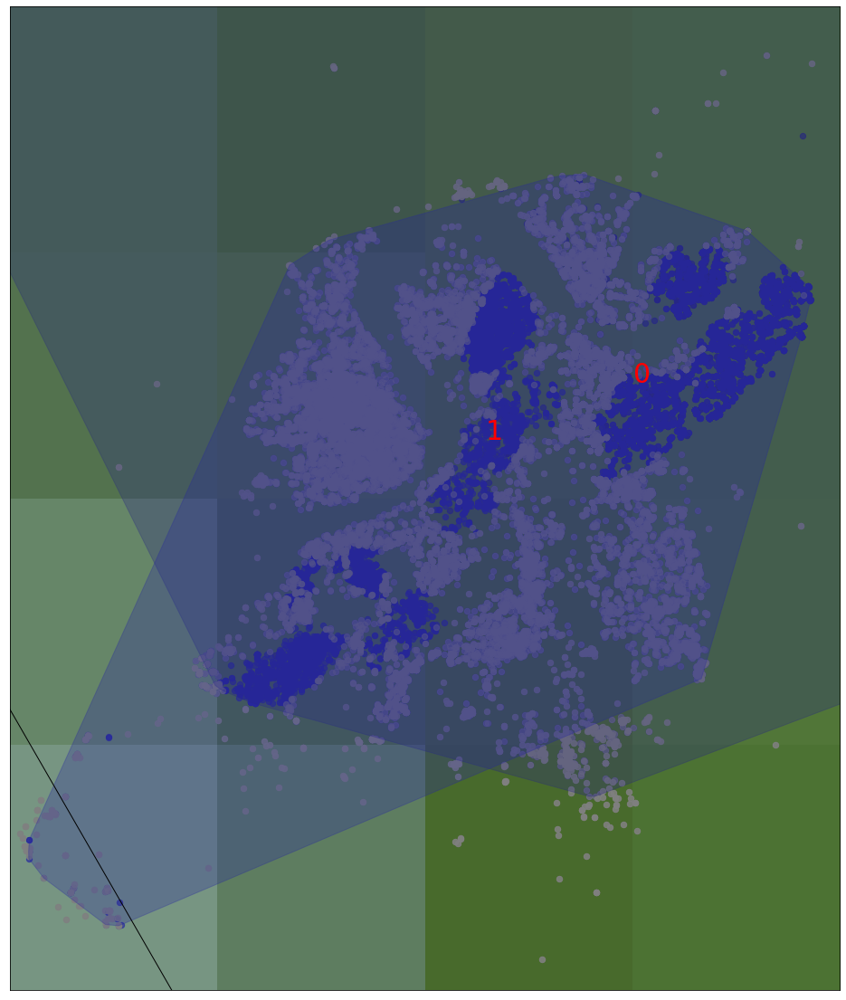

variance  0.001271212517184763
variance  0.0012665689396962423
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
Erro calculating the centroid for cluster no 4
Erro calculating the centroid for cluster no 5
Erro calculating the centroid for cluster no 6
None


In [ ]:
#do the same procesure for subsequent dates 
#get predicted labels for the following dates and then check the variance 
for date in range(1, len(dates_list)):
  df_date_temp = dates_list[date]
  df_date_temp = get_dates_list(df,df_date_temp)
  pred_labels= get_predicted_labels(df_date_temp,hdb)
  df_date_temp['clus_hdb_labels'] = pred_labels
  df_list = [df_date,df_date_temp]
  df_date = pd.concat(df_list)
  clustername_date = len(set(df_date['clus_hdb_labels']))

  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()
  print(variance_centroids(hdb,clustername_date,df_date))
  
  
  

[1 1 1 ... 1 1 1]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
4553        NaT  21.163619  ...           NaN           NaN
4554        NaT  21.157665  ...           NaN           NaN
4555        NaT  21.165650  ...           NaN           NaN
4556        NaT  21.184863  ...           NaN           NaN
4557        NaT  21.146249  ...           NaN           NaN

[9355 rows x 6 columns]
593
Cluster 0, data points 593
2189
Cluster 1, data points 2189
139


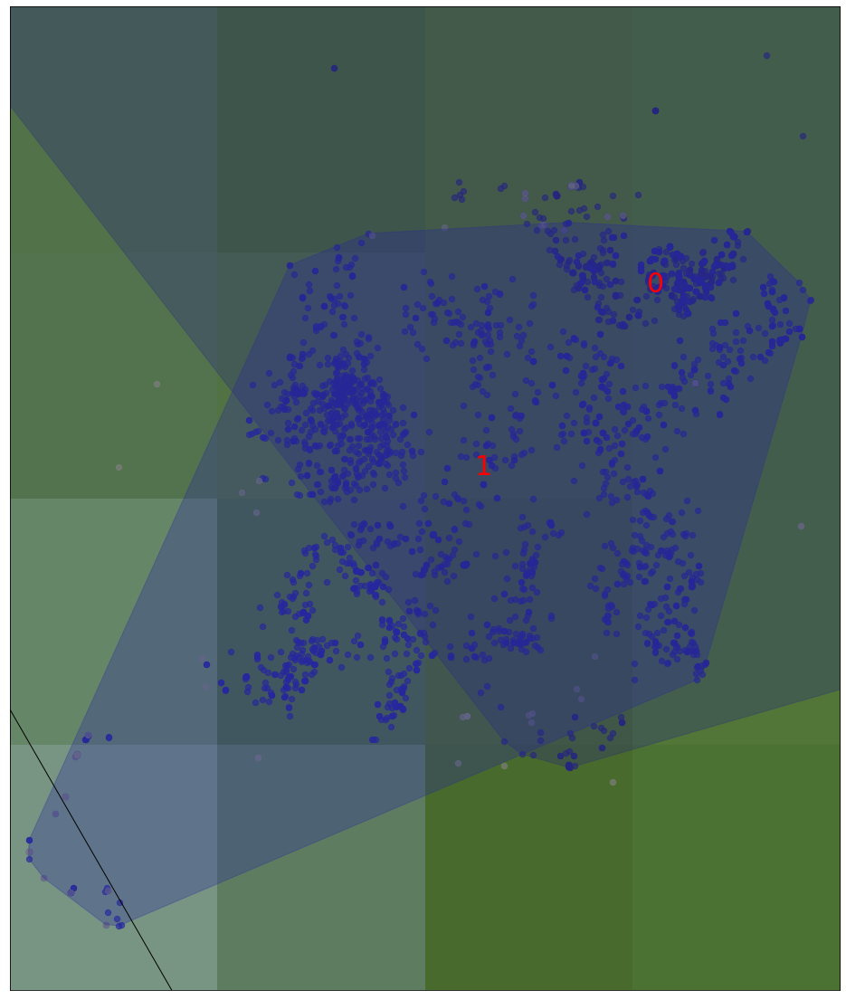

variance  0.0011423178515154266
variance  0.0011394176260418416
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[ 1  1  1 ... -1  1  0]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
7105        NaT  21.205525  ...           NaN           NaN
7106        NaT  21.168800  ...           NaN           NaN
7107        NaT  21.122881  ...           NaN           NaN
7108        NaT  21.213431  ...           NaN           NaN
7109        NaT  21.241242  ...           NaN           NaN

[11907 rows x 6 columns]
747
Cluster 0, data points 747
4410
Cluster 1, data points 4410


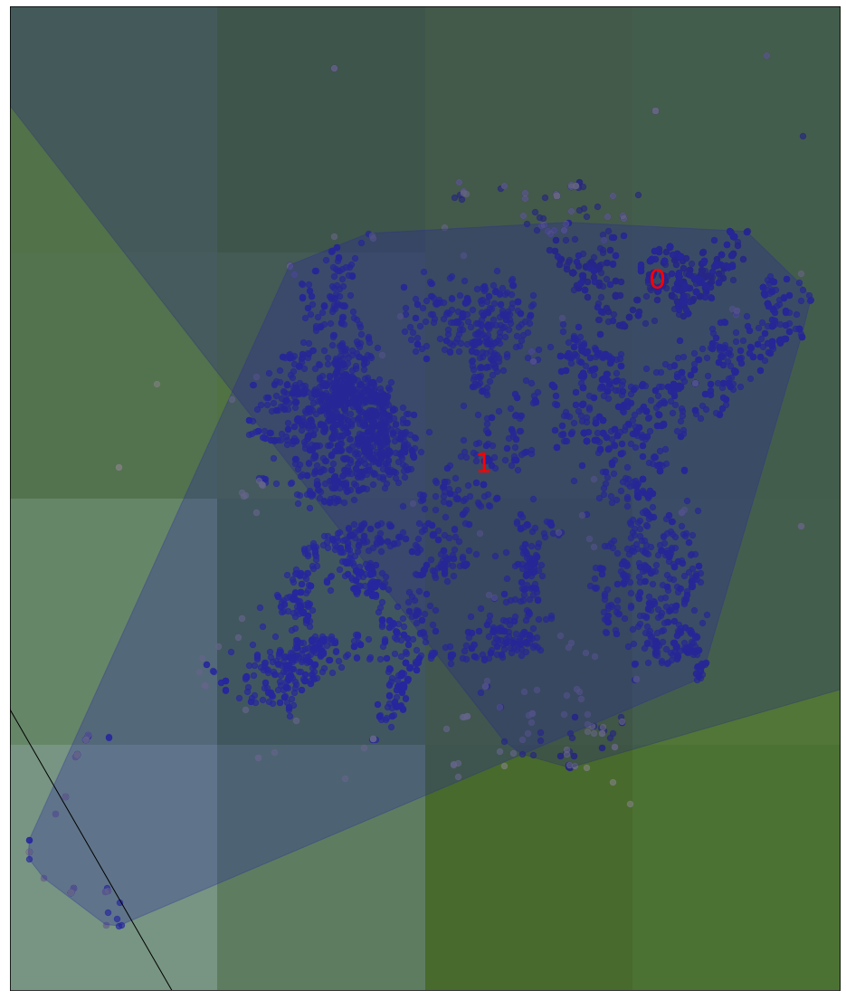

variance  0.0011771040927409625
variance  0.0011738730104200485
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[1 1 0 ... 0 1 1]
df
           Date   Latitude  ...            xm            ym
0    2021-04-03  21.223025  ...  12002.175691  19044.873960
1    2021-04-03  21.169480  ...  10047.568840  12658.938215
2    2021-04-03  21.195021  ...  10948.130567  15704.721344
3    2021-04-03  21.134580  ...   8037.165513   8497.891669
4    2021-04-03  21.166400  ...  12735.148952  12291.677450
...         ...        ...  ...           ...           ...
9392        NaT  21.243340  ...           NaN           NaN
9393        NaT  21.232523  ...           NaN           NaN
9394        NaT  21.147522  ...           NaN           NaN
9395        NaT  21.230184  ...           NaN           NaN
9396        NaT  21.209827  ...           NaN           NaN

[14194 rows x 6 columns]
890
Cluster 0, data points 890
6414
Cluster 1, data points 6414
456


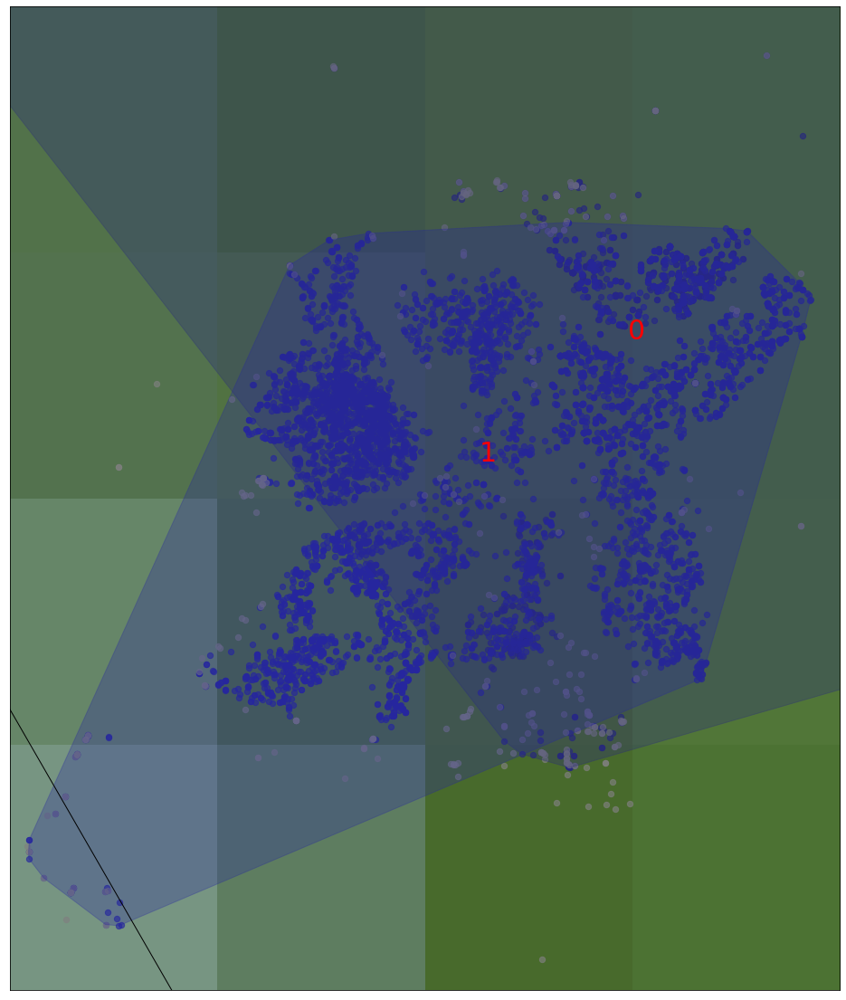

variance  0.0011601660048932495
variance  0.0011592854322534803
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[0 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
11685        NaT  21.223986  ...           NaN           NaN
11686        NaT  21.189148  ...           NaN           NaN
11687        NaT  21.212353  ...           NaN           NaN
11688        NaT  21.236115  ...           NaN           NaN
11689        NaT  21.219226  ...           NaN           NaN

[16487 rows x 6 columns]
1090
Cluster 0, data points 1090
8367
Cluster 1, data poin

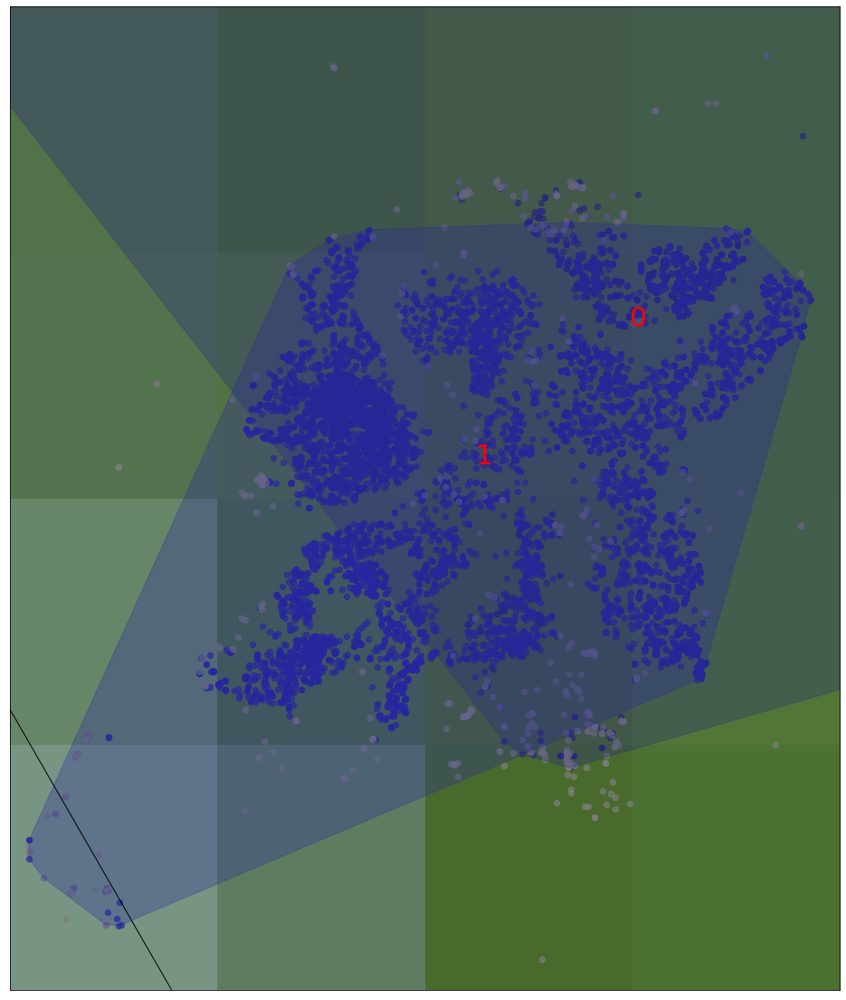

variance  0.0010992896647207902
variance  0.0010963986646073804
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
13870        NaT  21.244172  ...           NaN           NaN
13871        NaT  21.209169  ...           NaN           NaN
13872        NaT  21.210969  ...           NaN           NaN
13873        NaT  21.195138  ...           NaN           NaN
13874        NaT  21.207687  ...           NaN           NaN

[18672 rows x 6 columns]
1148
Cluster 0, data points 1148
10450
Cluster 1, data poi

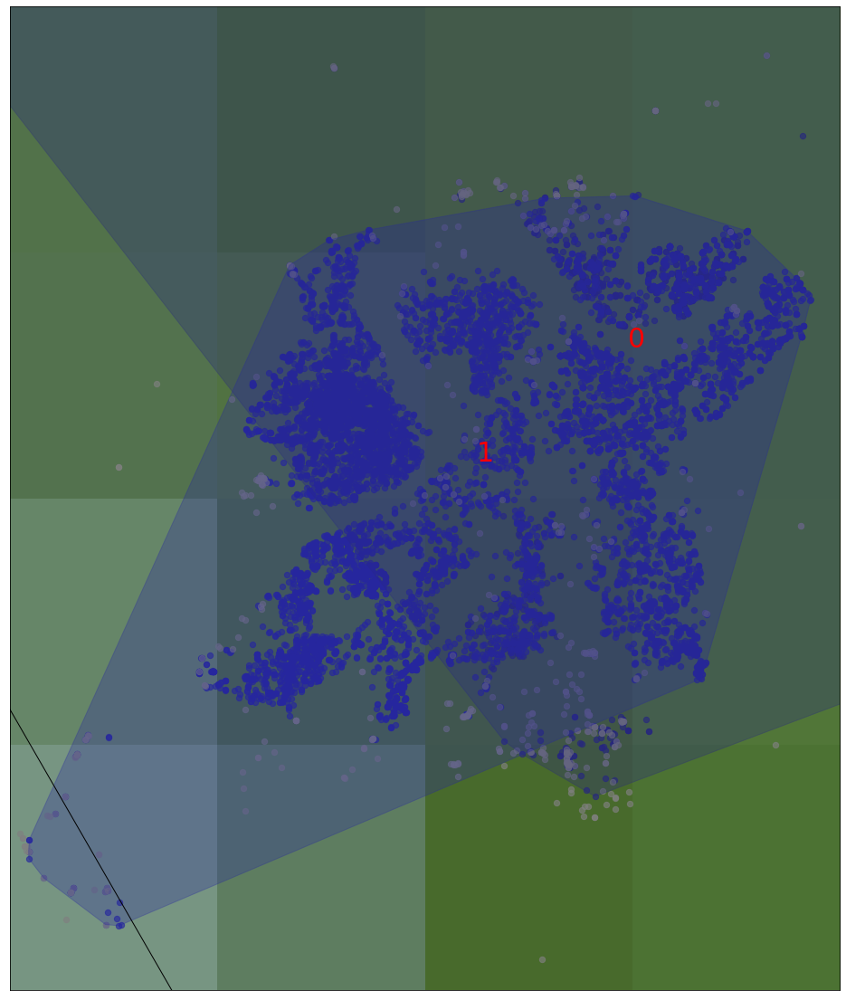

variance  0.001276119770501295
variance  0.0012727134249081347
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[0 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
16139        NaT  21.223474  ...           NaN           NaN
16140        NaT  21.193896  ...           NaN           NaN
16141        NaT  21.189766  ...           NaN           NaN
16142        NaT  21.245752  ...           NaN           NaN
16143        NaT  21.198418  ...           NaN           NaN

[20941 rows x 6 columns]
1187
Cluster 0, data points 1187
12600
Cluster 1, data poin

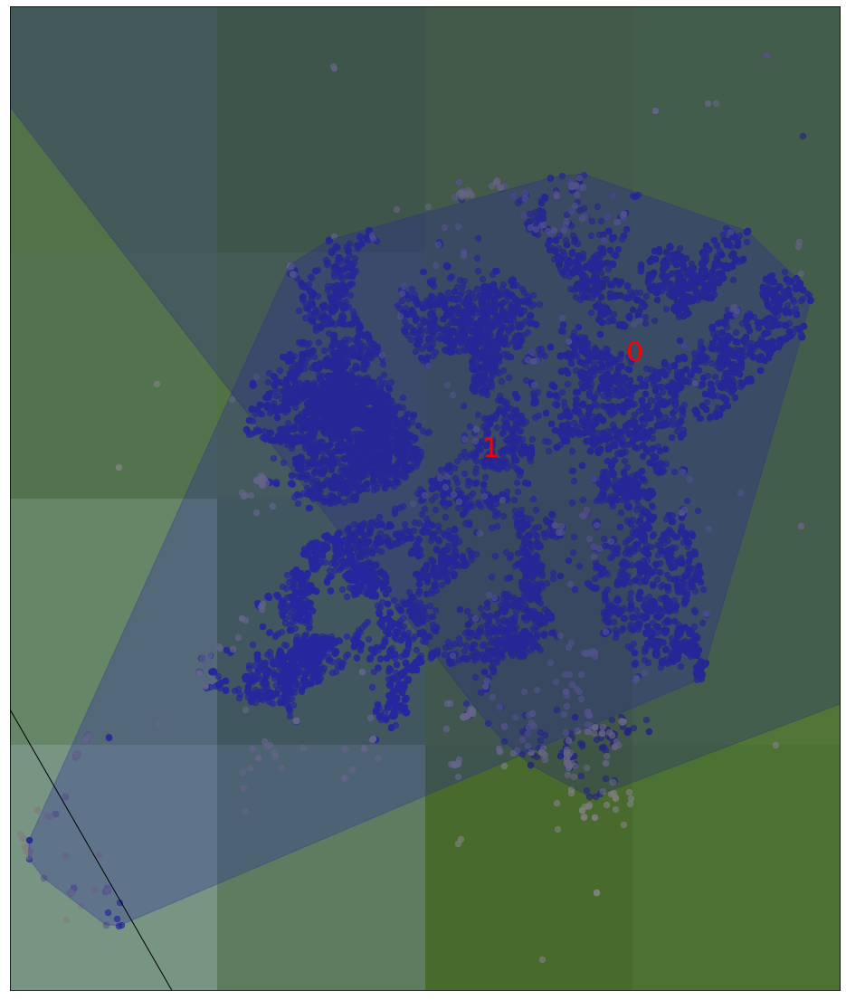

variance  0.0013320210575871144
variance  0.001329191425589606
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[ 1  0  1 ...  1  1 -1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
18982        NaT  21.219969  ...           NaN           NaN
18983        NaT  21.196573  ...           NaN           NaN
18984        NaT  21.204861  ...           NaN           NaN
18985        NaT  21.196573  ...           NaN           NaN
18986        NaT  21.116529  ...           NaN           NaN

[23784 rows x 6 columns]
1277
Cluster 0, data points 1277
15128
Cluster 1, dat

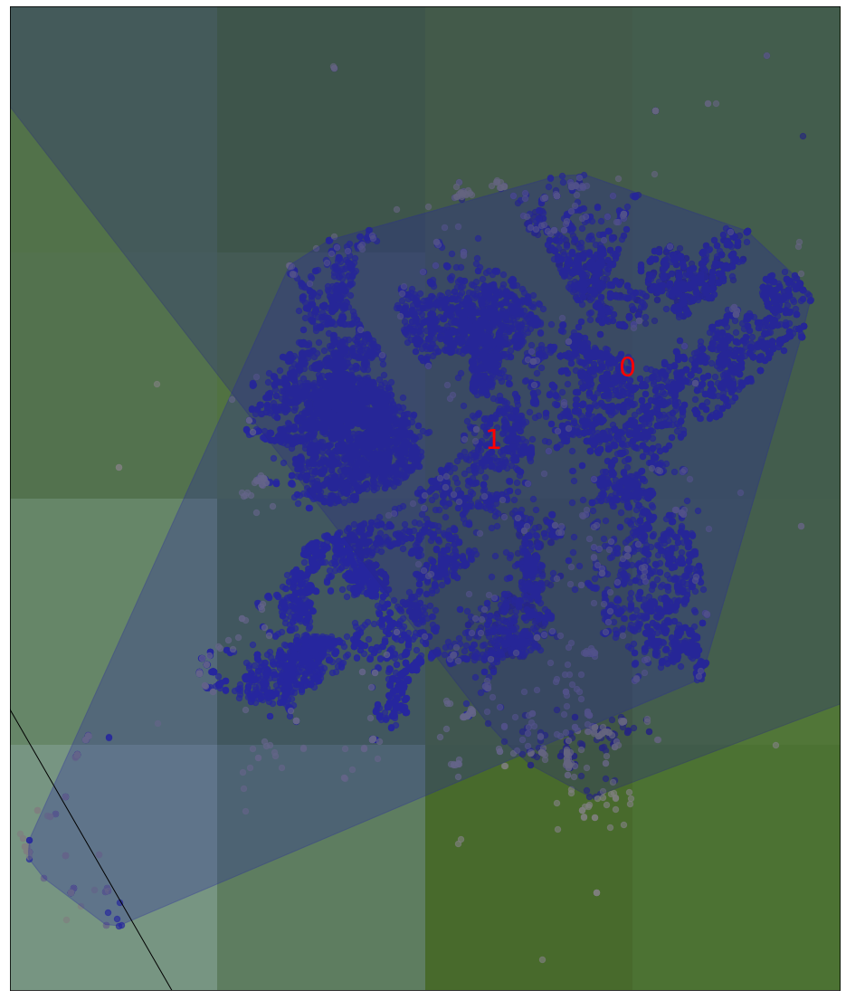

variance  0.001344937473531839
variance  0.0013440692008250613
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
21106        NaT  21.221817  ...           NaN           NaN
21107        NaT  21.206314  ...           NaN           NaN
21108        NaT  21.206721  ...           NaN           NaN
21109        NaT  21.156170  ...           NaN           NaN
21110        NaT  21.162953  ...           NaN           NaN

[25908 rows x 6 columns]
1307
Cluster 0, data points 1307
17153
Cluster 1, data poin

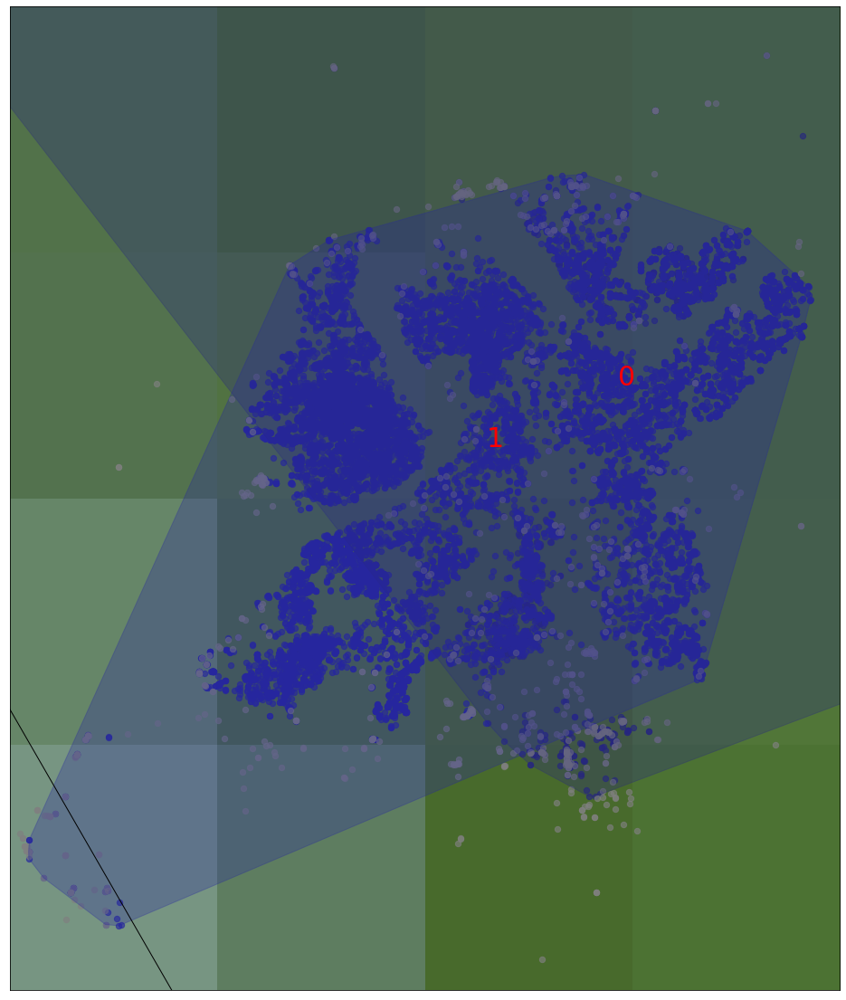

variance  0.0012997509620963701
variance  0.001296793279630837
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[ 1 -1  1 ...  1  1  1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
23036        NaT  21.150412  ...           NaN           NaN
23037        NaT  21.122378  ...           NaN           NaN
23038        NaT  21.146422  ...           NaN           NaN
23039        NaT  21.185642  ...           NaN           NaN
23040        NaT  21.216937  ...           NaN           NaN

[27838 rows x 6 columns]
1384
Cluster 0, data points 1384
18873
Cluster 1, dat

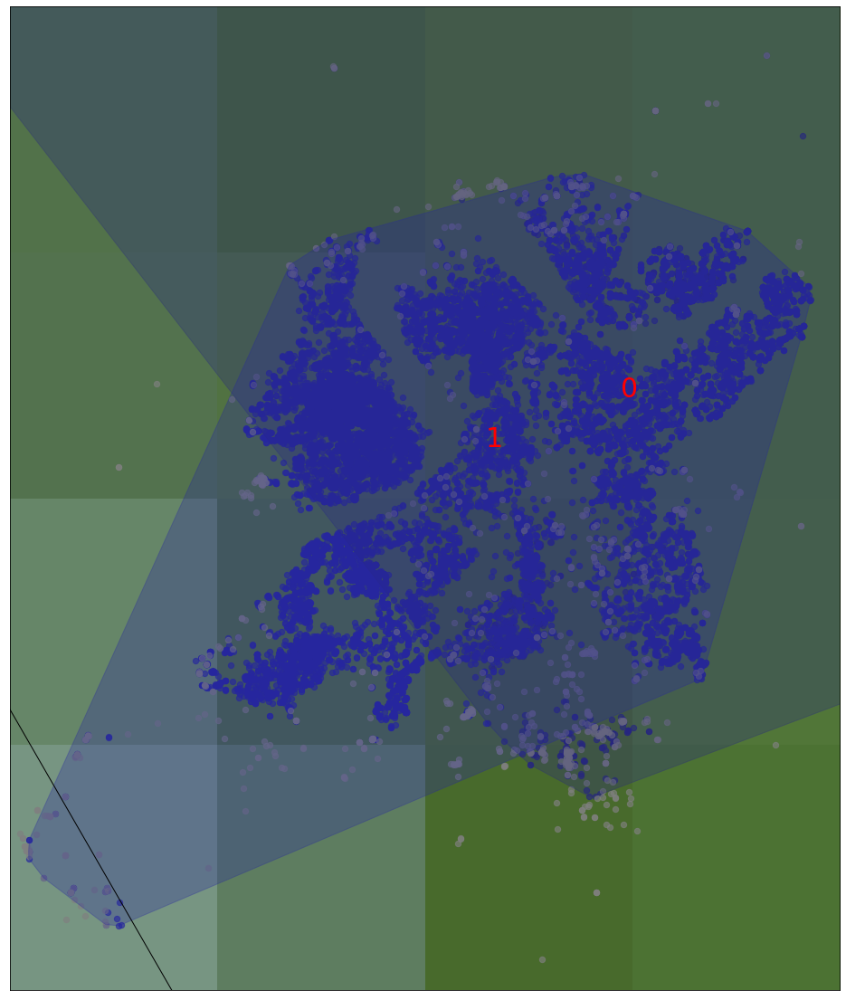

variance  0.0012685359946358172
variance  0.0012649907411440148
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
24885        NaT  21.236509  ...           NaN           NaN
24886        NaT  21.209130  ...           NaN           NaN
24887        NaT  21.226264  ...           NaN           NaN
24888        NaT  21.154199  ...           NaN           NaN
24889        NaT  21.154620  ...           NaN           NaN

[29687 rows x 6 columns]
1442
Cluster 0, data points 1442
20503
Cluster 1, data poi

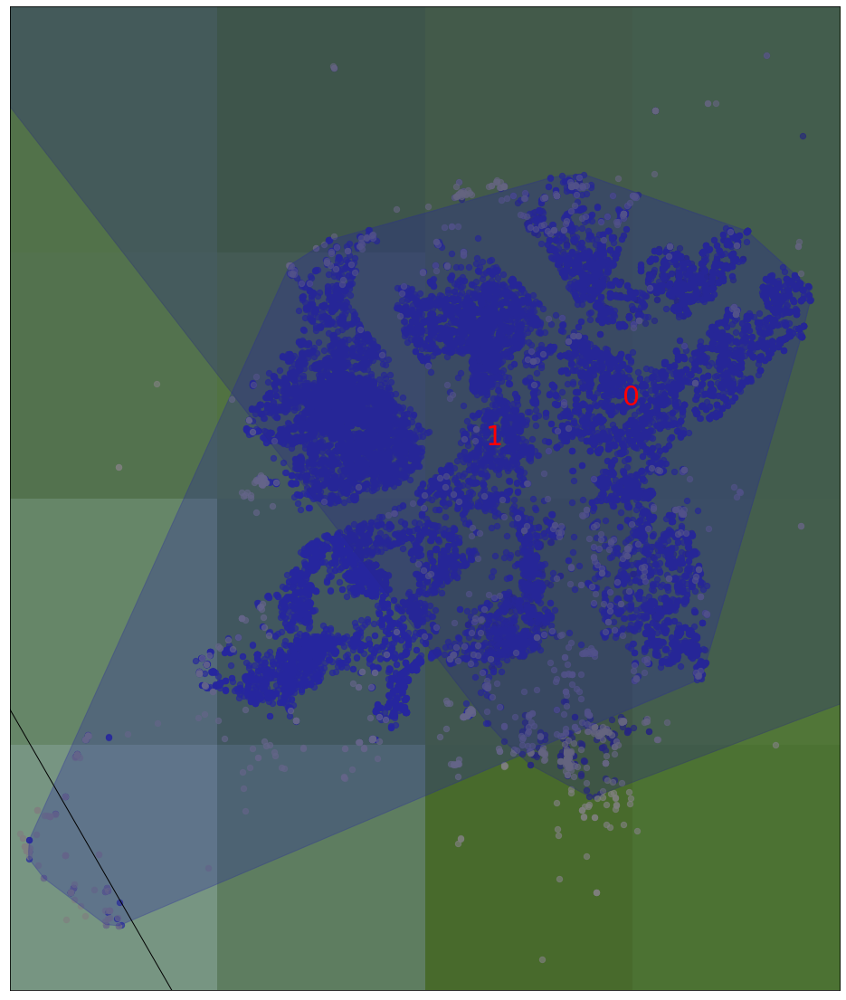

variance  0.0012183284936551908
variance  0.0012149600462491913
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[ 0  0  0 ...  0 -1  1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
26782        NaT  21.293729  ...           NaN           NaN
26783        NaT  21.215888  ...           NaN           NaN
26784        NaT  21.209043  ...           NaN           NaN
26785        NaT  21.927327  ...           NaN           NaN
26786        NaT  21.170406  ...           NaN           NaN

[31584 rows x 6 columns]
3108
Cluster 0, data points 3108
20543
Cluster 1, da

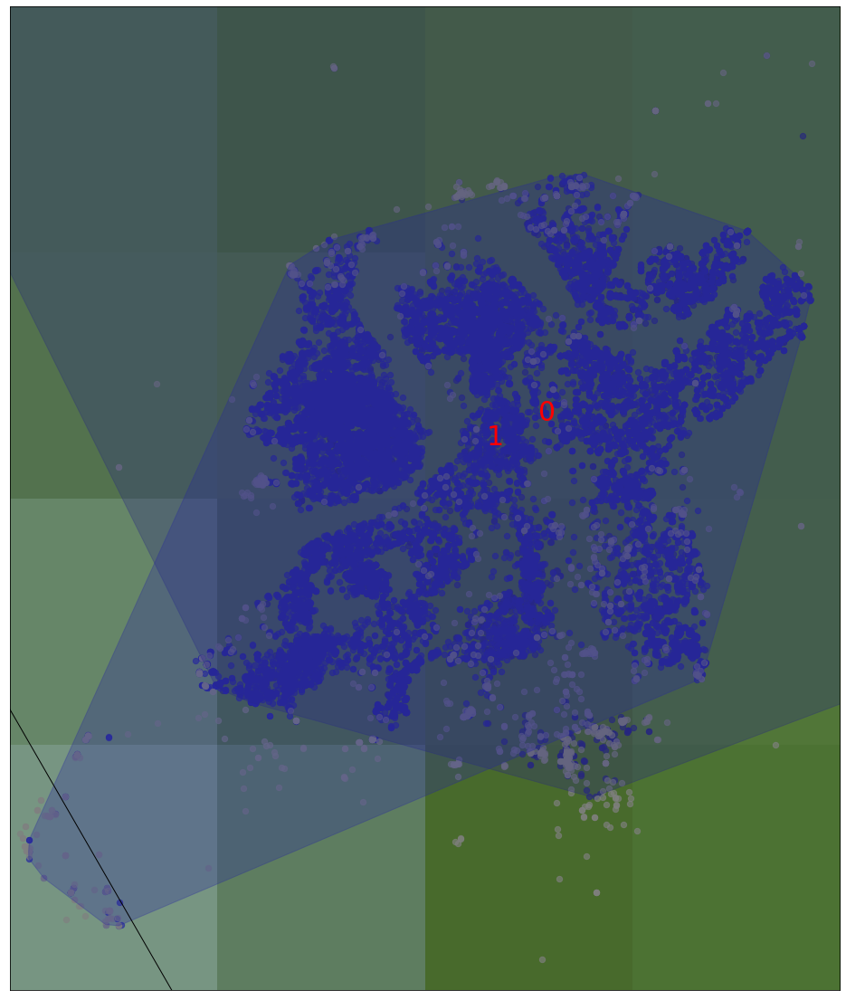

variance  0.0012201328450672244
variance  0.0012236413713104573
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[1 1 1 ... 1 1 1]
df
            Date   Latitude  ...            xm            ym
0     2021-04-03  21.223025  ...  12002.175691  19044.873960
1     2021-04-03  21.169480  ...  10047.568840  12658.938215
2     2021-04-03  21.195021  ...  10948.130567  15704.721344
3     2021-04-03  21.134580  ...   8037.165513   8497.891669
4     2021-04-03  21.166400  ...  12735.148952  12291.677450
...          ...        ...  ...           ...           ...
28582        NaT  21.170880  ...           NaN           NaN
28583        NaT  21.195642  ...           NaN           NaN
28584        NaT  21.222574  ...           NaN           NaN
28585        NaT  21.196461  ...           NaN           NaN
28586        NaT  21.152406  ...           NaN           NaN

[33384 rows x 6 columns]
3145
Cluster 0, data points 3145
22243
Cluster 1, data poi

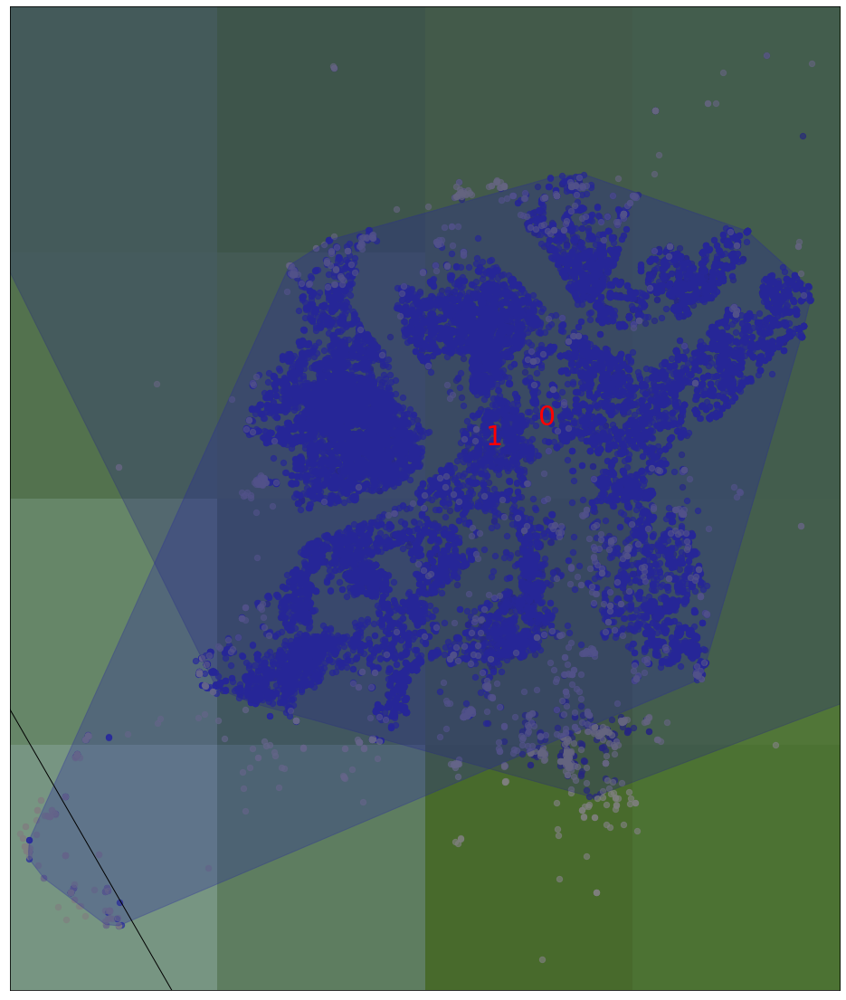

variance  0.001206251979578357
variance  0.0012032548529744135
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None
[ 1  1  1 -1  0  0  0 -1 -1 -1 -1 -1  1  1  1  1 -1  1  1  1 -1  1  1  1
 -1  1  1  1  1 -1  1 -1 -1  1 -1  1  1  1  1  1 -1 -1  1  1  1 -1 -1  1
  1 -1  1 -1  1  1 -1  0  1 -1  1 -1  1  1  1  1  1  1 -1  1  1 -1  1  1
 -1  0 -1 -1 -1  1 -1 -1  1 -1 -1 -1  1  1 -1 -1  1 -1  1  1  1 -1  1 -1
  1 -1 -1 -1 -1  1 -1  1 -1  1  1  1 -1 -1  0  0 -1 -1  0  1  0  1  1  0
  1  1  0  1  0  1  1  0  0  0  0 -1  1  0  1  0  1  1  1  1  0  1  0  1
  1 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  0 -1 -1 -1 -1  1  1
  0 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1 -1 -1 -1  0  1 -1  1  1 -1  0  1  1  1
  1  0 -1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1 -1 -1  1  0  0  1 -1 -1 -1  0 -1 -1  0 -1 -1 -1 -1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  

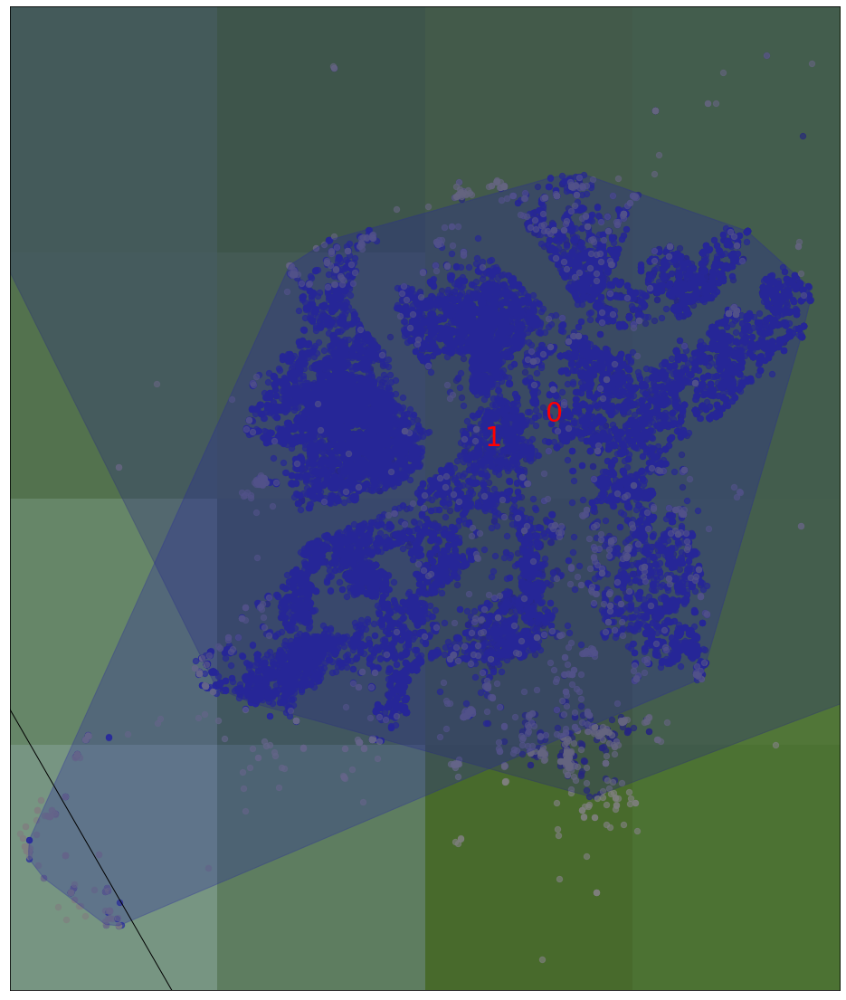

variance  0.0012835734823444594
variance  0.0012788510789065257
Erro calculating the centroid for cluster no 2
Erro calculating the centroid for cluster no 3
None


In [ ]:
for date in range(1, len(dates_list)):
  df_date_temp = dates_list[date]
  df_date_temp = get_dates_list(df,df_date_temp)
  df_date_temp = df_date_temp[["Latitude","Longitude"]]
  hdb_labels = hdb.fit_predict(np.radians(df_date_temp))
  print(hdb_labels)
  df_date_temp['clus_hdb_labels'] = hdb_labels
  df_list = [df_date,df_date_temp]
  df_date = pd.concat(df_list)
  clustername_date = len(set(df_date['clus_hdb_labels']))

  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()
  print(variance_centroids(hdb,clustername_date,df_date))

In [ ]:
for date in range(1, len(dates_list)):
  df_date_temp = dates_list[date]
  df_date_temp = get_dates_list(df,df_date_temp)
  df_date_temp = df_date_temp[["Latitude","Longitude"]]
  hdb_labels = hdb.fit_predict(np.radians(df_date_temp))
  print(hdb_labels)
  df_date_temp['clus_hdb_labels'] = hdb_labels
  df_list = [df_date,df_date_temp]
  df_date = pd.concat(df_list)
  clustername_date = len(set(df_date['clus_hdb_labels']))

  plot_map(df_date,hdb_labels,clustername_date)
  plt.show()
  print(variance_centroids(hdb,clustername_date,df_date))

(array([ 0,  1,  0, ...,  0, -1,  0]), 170)


ValueError: ignored

<class 'pandas.core.frame.DataFrame'>
The relative validtiy of the clustering is 0.07486628831373142
df
           Date   Latitude  Longitude  clus_hdb_labels
0    2021-04-03  21.223025  72.808018                2
1    2021-04-03  21.169480  72.790440                2
2    2021-04-03  21.195021  72.798539                2
3    2021-04-03  21.134580  72.772360                2
4    2021-04-03  21.166400  72.814610                2
...         ...        ...        ...              ...
7105 2021-04-05  21.205525  72.872036                2
7106 2021-04-05  21.168800  72.834573                2
7107 2021-04-05  21.122881  72.847671                2
7108 2021-04-05  21.213431  72.889128                2
7109 2021-04-05  21.241242  72.880264                0

[7110 rows x 4 columns]
559
Cluster 0, data points 559
42
Cluster 1, data points 42
6434
Cluster 2, data points 6434
75


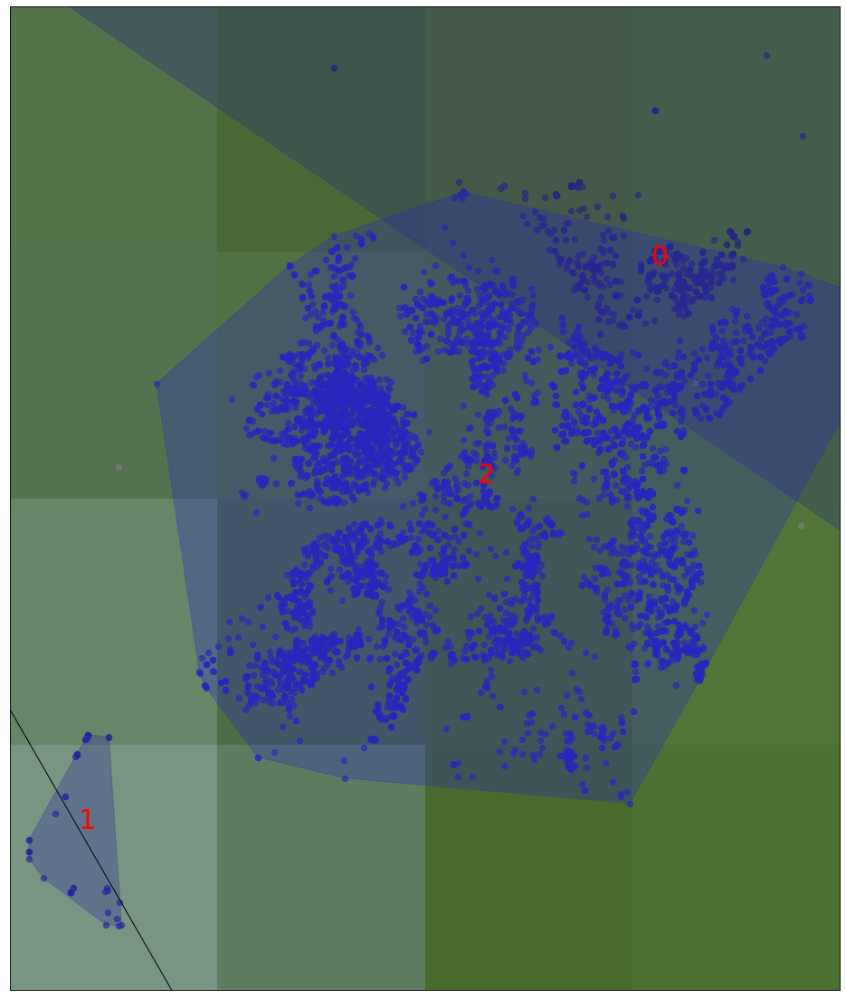

In [ ]:
df_date = get_dates_list(df,dates_list[0])
df_date2 = get_dates_list(df,dates_list[1])
df_date3 = get_dates_list(df,dates_list[2])
df_date = pd.concat([df_date,df_date2,df_date3])
# print(len(df_date))
earth_radius = 6371
epsilon = 0.0003 #calculate 5 meter epsilon threshold
hdb, hdb_labels = hdbscan_model_epsilon(df_date,epsilon)

df_date["clus_hdb_labels"] = hdb_labels

label_hdb = list(set(hdb_labels))
# realclustername_date = len(set(labels_hdb))-(1 if -1 in labels_hdb else 0)
clustername_date = len(set(hdb_labels))

plot_map(df_date,hdb_labels,clustername_date)
plt.show()